In [2]:
%matplotlib inline

import cosima_cookbook as cc
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
import cartopy.crs as ccrs
import xarray as xr
import cmocean.cm as cmocean
import glob
import matplotlib.path as mpath
import matplotlib.colors as col
from netCDF4 import Dataset
import gsw


import logging
logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

from dask.distributed import Client

figdir = '/g/data/e14/pc5520/figures/basal_melt_param/'

In [3]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/43835/status,
Dashboard: /proxy/43835/status,Workers: 6
Total threads: 24,Total memory: 128.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:37399,Workers: 6
Dashboard: /proxy/43835/status,Total threads: 24
Started: Just now,Total memory: 128.00 GiB
Comm: tcp://127.0.0.1:33667,Total threads: 4
Dashboard: /proxy/42239/status,Memory: 21.33 GiB
Nanny: tcp://127.0.0.1:35431,


List of obs and model units. 

| Oservations/Model | Temperature units | Salinity units |
| --- | --- | --- |
| Pauthenet et al. (2021) | in situ temperature [C] | Practical salinity [psu] |
| Schmidtko et a. (2014) | Conservative temperature [C] | Absolute salinity [g/kg] |
| --- | --- | --- |
| ACCESS-OM2-01 |  Conservative temperature [K] | Practical salinity [psu]  |


Read in perturbation and control model data. 

In [9]:

Tfreezing_min_calv_2_gade = 'accessom2-GPC023'#'accessom2-GPC015'
gade_icb = 'accessom2-GPC026'


lat_slice  = slice(-85,-60)
fontsize=15


start_time='1904-01-01'
end_time='1905-01-01'

In [10]:
# build database for these experiments:
session_name = '/g/data/e14/pc5520/model_data/access-om2/basal_melt_MOM5/basal_melt_MOM5.db'
basal_melt_session = cc.database.create_session(session_name)

dir_list = [ '/g/data/ik11/outputs/access-om2-01/basal_melt_outputs/accessom2-GPC023/accessom2-GPC023/',
           '/g/data/ik11/outputs/access-om2-01/basal_melt_outputs/accessom2-GPC026/accessom2-GPC026/']
#cc.database.build_index(dir_list,basal_melt_session)

In [11]:
session_name = '/g/data/v45/wf4500/databases/gdata_01deg_jra55v13_ryf9091_DSW.db'
master_session = cc.database.create_session(session_name)
control = '01deg_jra55v13_ryf9091_DSW'

In [12]:
# read in temperature and salinity variables
# control
temp_cntl = cc.querying.getvar(control, 'temp', master_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice) - 273.15
salt_cntl = cc.querying.getvar(control, 'salt', master_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice)
dzt_cntl = cc.querying.getvar(control, 'dzt', master_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice)

# GPC015
temp_gade = cc.querying.getvar(Tfreezing_min_calv_2_gade, 'temp', basal_melt_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice) - 273.15
salt_gade = cc.querying.getvar(Tfreezing_min_calv_2_gade, 'salt', basal_melt_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice)
dzt_gade = cc.querying.getvar(Tfreezing_min_calv_2_gade, 'dzt', basal_melt_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice)

#GPC018
temp_gade_icb = cc.querying.getvar(gade_icb, 'temp', basal_melt_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice) - 273.15
salt_gade_icb = cc.querying.getvar(gade_icb, 'salt', basal_melt_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice)
dzt_gade_icb = cc.querying.getvar(gade_icb, 'dzt', basal_melt_session, frequency='1 monthly',
                               start_time=start_time, end_time=end_time).sel(yt_ocean=lat_slice)


Read in observations, convert units, and concatenate to same longitude as model. 

In [13]:
# read in observations from Pauthenet at al. (2021)
obsfile = '/g/data/e14/hd4873/obs_data/pauthenetetal2021/TS_Climato_Antarctic60S.nc'
obs = xr.open_dataset(obsfile).mean(dim='time')

# convert in-situ temperature to conservative temperature
p = gsw.p_from_z(-obs.depth, obs.lat)
# first we need absolute salinity
AS = gsw.SA_from_SP(obs.Sal, p, obs.lon, obs.lat)
# now we can get CT from in-situ temp
obs['Temp'] = gsw.CT_from_t(AS, obs.Temp, p)
del AS # delete absolute salinity as we don't need it

# concat observations onto model grid.
x = obs.lon.values
x[x> 80] = x[x>80]-360
# replace lon coordinate values with these modified longitude values
obs['lon'] = x
# now concatenate temp and salinity so that it goes from -280 to 80 like access
obs_temp = xr.concat((obs.Temp[521:,:,:], obs.Temp[0:521,:,:]), dim='lon')
obs_salt = xr.concat((obs.Sal[521:,:,:], obs.Sal[0:521,:,:]), dim='lon')
#obs_temp[:,:,0].T.plot()
#plt.show()

Now interpolate obs onto model grid. Note, this is a very basic interpolation, should probably use something more sophisticated. 

In [14]:
def interp_obs(obs,model_lat,model_lon): 
    obs_new = obs.interp(lat = model_lat, lon = model_lon)
    return obs_new

obs_temp = interp_obs(obs_temp,temp_cntl.yt_ocean,temp_cntl.xt_ocean)
obs_salt = interp_obs(obs_salt,salt_cntl.yt_ocean,salt_cntl.xt_ocean)

Calculate anomalies. 

In [15]:
%%time
z_range=[10,50] # maximum range of the Pauthenet et al. (2021) data. 
zslice = slice(z_range[0],z_range[1])

# first calculate depth-averaged mean temperature and salnity
dzt_cntl_slice = dzt_cntl.sel(st_ocean=zslice)/dzt_cntl.sel(st_ocean=zslice).sum(dim='st_ocean')
dzt_gade_slice = dzt_gade.sel(st_ocean=zslice)/dzt_gade.sel(st_ocean=zslice).sum(dim='st_ocean')
dzt_gade_icb_slice = dzt_gade_icb.sel(st_ocean=zslice)/dzt_gade_icb.sel(st_ocean=zslice).sum(dim='st_ocean')

temp_cntl_mean = (temp_cntl.sel(st_ocean=zslice)*dzt_cntl_slice).sum(dim='st_ocean').mean(dim='time').load()
salt_cntl_mean = (salt_cntl.sel(st_ocean=zslice)*dzt_cntl_slice).sum(dim='st_ocean').mean(dim='time').load()

temp_gade_mean = (temp_gade.sel(st_ocean=zslice)*dzt_gade_slice).sum(dim='st_ocean').mean(dim='time').load()
salt_gade_mean = (salt_gade.sel(st_ocean=zslice)*dzt_gade_slice).sum(dim='st_ocean').mean(dim='time').load()

temp_gade_icb_mean = (temp_gade_icb.sel(st_ocean=zslice)*dzt_gade_icb_slice).sum(dim='st_ocean').mean(dim='time').load()
salt_gade_icb_mean = (salt_gade_icb.sel(st_ocean=zslice)*dzt_gade_icb_slice).sum(dim='st_ocean').mean(dim='time').load()

temp_cntl_mean = temp_cntl_mean.where( temp_cntl_mean != 0., np.nan)
salt_cntl_mean = salt_cntl_mean.where( salt_cntl_mean != 0., np.nan)

temp_gade_mean = temp_gade_mean.where( temp_gade_mean != 0., np.nan)
salt_gade_mean = salt_gade_mean.where( salt_gade_mean != 0., np.nan)

temp_gade_icb_mean = temp_gade_icb_mean.where( temp_gade_icb_mean != 0., np.nan)
salt_gade_icb_mean = salt_gade_icb_mean.where( salt_gade_icb_mean != 0., np.nan)

# now calculate anomalies
# do not need to weight observations since they are evenly spaced (vertically) every 2 m
temp_cntl_a = temp_cntl_mean - obs_temp.sel(depth=zslice).mean(dim='depth').T
salt_cntl_a = salt_cntl_mean - obs_salt.sel(depth=zslice).mean(dim='depth').T
temp_gade_a = temp_gade_mean - obs_temp.sel(depth=zslice).mean(dim='depth').T
salt_gade_a = salt_gade_mean - obs_salt.sel(depth=zslice).mean(dim='depth').T
temp_gade_icb_a = temp_gade_icb_mean - obs_temp.sel(depth=zslice).mean(dim='depth').T
salt_gade_icb_a = salt_gade_icb_mean - obs_salt.sel(depth=zslice).mean(dim='depth').T

CPU times: user 1min 11s, sys: 4.77 s, total: 1min 15s
Wall time: 1min 44s


Define figure functions and other plotting data. 

In [16]:
fontsize=16
subplot_titles = ['Observations',
                 'RYF (control) - Obs',
                 'GPC023 (Basal)- Obs',
                 'GPC026 (ICB) - Obs']
subplot_labels = ['a)','b)','c)','d)','e)','f)','g)','h)']

# topography data for plotting:
data_path = '/g/data/ik11/outputs/access-om2-01/01deg_jra55v13_ryf9091/'
htfile = data_path + 'output196/ocean/ocean_grid.nc'
ht = xr.open_dataset(htfile).ht.sel(yt_ocean=slice(-90,-55)).load()
land_mask = np.squeeze(ht.values)*0
land_mask[np.isnan(land_mask)] = 1
land_mask = np.where(land_mask==1,land_mask,np.nan)
land_mask_masked = np.ma.masked_where((land_mask==0),land_mask)
# make land go all the way to -90S:
land_mask_lat = ht.yt_ocean.values
land_mask_lat[0] = -90

# define circle 
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)

def map_elements(axes):
    for i, ax in enumerate(axes.flatten()):
        ax.set_boundary(circle, transform=ax.transAxes)
        ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
        ax.set_extent([-280, 80, -90, -60], ccrs.PlateCarree())
        if i <= 3:
            ax.set_title(subplot_titles[i],fontsize=16)
        ax.text(0.1, 0.95, subplot_labels[i],fontsize=20, fontweight='bold',transform = ax.transAxes)
        
def plot_colorbar(fig,axes_loc,cb_item,label):
    cbaxes = fig.add_axes(axes_loc)
    cbar = plt.colorbar(cb_item, cax = cbaxes, orientation = 'vertical',extend = 'both', shrink=0.5)
    cbar.set_label(label,fontsize=fontsize,labelpad=3)
    cbar.ax.tick_params(labelsize=14)
    return cbar

def figure_ts_zrange(z_range,obs_temp,obs_salt,cntl_temp_a,cntl_salt_a,temp_gade_a,salt_gade_a,temp_gade_icb_a,salt_gade_icb_a):
    plt.rcParams['font.size'] = 16
    fig,axes = plt.subplots(2,4,figsize=(23,12),subplot_kw={'projection': ccrs.SouthPolarStereo()})
    plt.subplots_adjust(wspace=0.02, hspace=0.01)
    map_elements(axes)
    vminT, vmaxT = -3, 3
    vminS, vmaxS = 33.5, 34.8
    #vminT, vmaxT = -2, 3
    #vminS, vmaxS = 34.0, 34.8
    #cmapT, cmapS, cmapA = cmocean.thermal, cmocean.haline, cmocean.balance
    cmapT, cmapS, cmapA = cmocean.cm.jet, cmocean.cm.jet, cmocean.balance
    vminTa, vmaxTa = -1.2, 1.2
    vminSa, vmaxSa = -0.3, 0.3
    for i, ax in enumerate(axes.flatten()):
        ax.text(0.55, 0.5, f'{z_range[0]}-{z_range[1]}m', ha='center', va='center', transform = ax.transAxes)
    # plot observations
    cb_varT = axes[0,0].pcolormesh(obs_temp.xt_ocean, obs_temp.yt_ocean, obs_temp.sel(depth=zslice).mean(dim='depth').T,
                   cmap = cmapT, vmin=vminT, vmax=vmaxT, 
                   transform = ccrs.PlateCarree())
    cb_varS = axes[1,0].pcolormesh(obs_salt.xt_ocean, obs_salt.yt_ocean, obs_salt.sel(depth=zslice).mean(dim='depth').T,
               cmap = cmapS, vmin=vminS, vmax=vmaxS, 
               transform = ccrs.PlateCarree())
    plot_colorbar(fig,[0.08, 0.55, 0.010, 0.3],cb_varT,'Conservative temperature (\u00b0C)')
    plot_colorbar(fig,[0.08, 0.16, 0.010, 0.3],cb_varS,'Practical salinity (psu)')
    # plot control anomalies
    cb_anomT = axes[0,1].pcolormesh(cntl_temp_a.xt_ocean, cntl_temp_a.yt_ocean, cntl_temp_a,
                   cmap = cmapA, vmin=vminTa, vmax=vmaxTa, 
                   transform = ccrs.PlateCarree())
    cb_anomS = axes[1,1].pcolormesh(cntl_salt_a.xt_ocean, cntl_salt_a.yt_ocean, cntl_salt_a,
                   cmap = cmapA, vmin=vminSa, vmax=vmaxSa, 
                   transform = ccrs.PlateCarree())
    # plot perturbation anomalies
    axes[0,2].pcolormesh(cntl_temp_a.xt_ocean, cntl_temp_a.yt_ocean, temp_gade_a,
                   cmap = cmapA, vmin=vminTa, vmax=vmaxTa, 
                   transform = ccrs.PlateCarree())
    axes[1,2].pcolormesh(cntl_temp_a.xt_ocean, cntl_temp_a.yt_ocean, salt_gade_a,
                   cmap = cmapA, vmin=vminSa, vmax=vmaxSa, 
                   transform = ccrs.PlateCarree())
    # plot perturbation - control anomalies
    axes[0,3].pcolormesh(cntl_temp_a.xt_ocean, cntl_temp_a.yt_ocean, temp_gade_icb_a,
                   cmap = cmapA, vmin=vminTa, vmax=vmaxTa, 
                   transform = ccrs.PlateCarree())
    axes[1,3].pcolormesh(cntl_temp_a.xt_ocean, cntl_temp_a.yt_ocean, salt_gade_icb_a,
                   cmap = cmapA, vmin=vminSa, vmax=vmaxSa, 
                   transform = ccrs.PlateCarree())
    plot_colorbar(fig,[0.91, 0.55, 0.010, 0.3],cb_anomT,'$\Delta$CT (\u00b0C)')
    plot_colorbar(fig,[0.91, 0.16, 0.010, 0.3],cb_anomS,'$\Delta$PS (psu)')
    return fig, axes

Plot figure with climatology and differences from ACCESS-OM2-01 control and perturbation. 

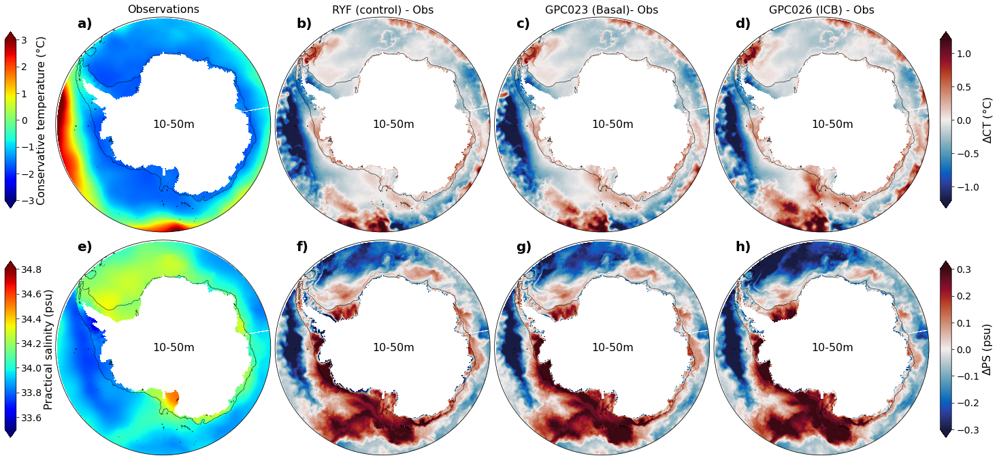

In [17]:
figure_ts_zrange(z_range, obs_temp, obs_salt, temp_cntl_a, salt_cntl_a,temp_gade_a,salt_gade_a,temp_gade_icb_a,salt_gade_icb_a)

plt.show()

In [12]:
#Now for 300m

In [18]:
%%time
z_range=[300,350] # maximum range of the Pauthenet et al. (2021) data. 
zslice = slice(z_range[0],z_range[1])

# first calculate depth-averaged mean temperature and salnity
dzt_cntl_slice = dzt_cntl.sel(st_ocean=zslice)/dzt_cntl.sel(st_ocean=zslice).sum(dim='st_ocean')
dzt_gade_slice = dzt_gade.sel(st_ocean=zslice)/dzt_gade.sel(st_ocean=zslice).sum(dim='st_ocean')
dzt_gade_icb_slice = dzt_gade_icb.sel(st_ocean=zslice)/dzt_gade_icb.sel(st_ocean=zslice).sum(dim='st_ocean')

temp_cntl_mean = (temp_cntl.sel(st_ocean=zslice)*dzt_cntl_slice).sum(dim='st_ocean').mean(dim='time').load()
salt_cntl_mean = (salt_cntl.sel(st_ocean=zslice)*dzt_cntl_slice).sum(dim='st_ocean').mean(dim='time').load()

temp_gade_mean = (temp_gade.sel(st_ocean=zslice)*dzt_gade_slice).sum(dim='st_ocean').mean(dim='time').load()
salt_gade_mean = (salt_gade.sel(st_ocean=zslice)*dzt_gade_slice).sum(dim='st_ocean').mean(dim='time').load()

temp_gade_icb_mean = (temp_gade_icb.sel(st_ocean=zslice)*dzt_gade_icb_slice).sum(dim='st_ocean').mean(dim='time').load()
salt_gade_icb_mean = (salt_gade_icb.sel(st_ocean=zslice)*dzt_gade_icb_slice).sum(dim='st_ocean').mean(dim='time').load()

temp_cntl_mean = temp_cntl_mean.where( temp_cntl_mean != 0., np.nan)
salt_cntl_mean = salt_cntl_mean.where( salt_cntl_mean != 0., np.nan)

temp_gade_mean = temp_gade_mean.where( temp_gade_mean != 0., np.nan)
salt_gade_mean = salt_gade_mean.where( salt_gade_mean != 0., np.nan)

temp_gade_icb_mean = temp_gade_icb_mean.where( temp_gade_icb_mean != 0., np.nan)
salt_gade_icb_mean = salt_gade_icb_mean.where( salt_gade_icb_mean != 0., np.nan)

# now calculate anomalies
# do not need to weight observations since they are evenly spaced (vertically) every 2 m
temp_cntl_a = temp_cntl_mean - obs_temp.sel(depth=zslice).mean(dim='depth').T
salt_cntl_a = salt_cntl_mean - obs_salt.sel(depth=zslice).mean(dim='depth').T
temp_gade_a = temp_gade_mean - obs_temp.sel(depth=zslice).mean(dim='depth').T
salt_gade_a = salt_gade_mean - obs_salt.sel(depth=zslice).mean(dim='depth').T
temp_gade_icb_a = temp_gade_icb_mean - obs_temp.sel(depth=zslice).mean(dim='depth').T
salt_gade_icb_a = salt_gade_icb_mean - obs_salt.sel(depth=zslice).mean(dim='depth').T

CPU times: user 1min 9s, sys: 4.73 s, total: 1min 14s
Wall time: 1min 40s


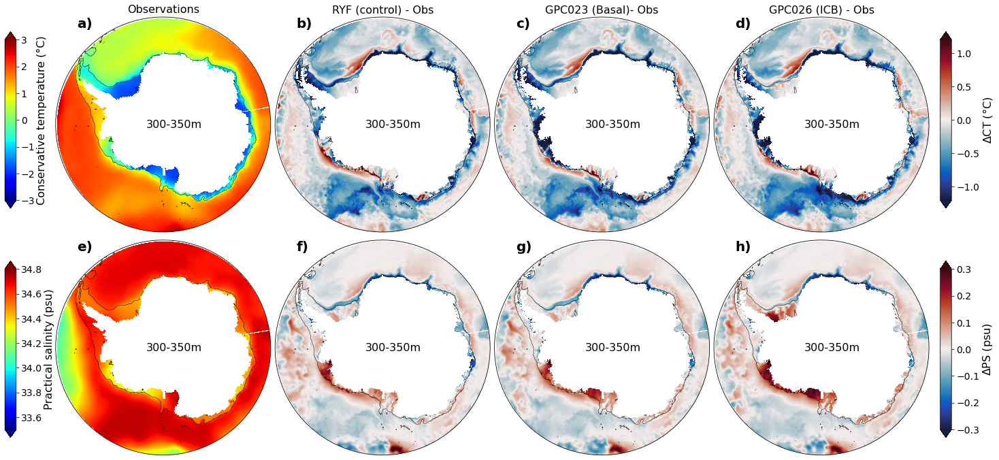

In [19]:
figure_ts_zrange(z_range, obs_temp, obs_salt, temp_cntl_a, salt_cntl_a,temp_gade_a,salt_gade_a,temp_gade_icb_a,salt_gade_icb_a)

plt.show()

## Original code. 

In [ ]:
# build database for these experiments:
observations = 'TS_data'
session_data = '/g/data/e14/pc5520/model_data/access-om2/basal_melt_MOM5/TS_data.db'
obs_session = cc.database.create_session(session_data)
dir_TSobs = ['/g/data/e14/pc5520/TS_data/']
cc.database.build_index(dir_TSobs,obs_session)

Indexing experiment: TS_data


0

In [ ]:
#Import obs
salt_obs = cc.querying.getvar(observations, 'Sal', obs_session, ncfile='TS_Climato_Antarctic60S.nc')
temp_obs = cc.querying.getvar(observations, 'Temp', obs_session, ncfile='TS_Climato_Antarctic60S.nc')

In [ ]:
# database for control simulation:
#master_session = cc.database.create_session('/g/data/ik11/databases/cosima_master.db')
#control = '01deg_jra55v13_ryf9091'

# database for perturbations:
#basal_session = cc.database.create_session('/g/data/v45/akm157/model_data/access-om2/01deg_jra55v13_ryf9091_easterlies_up10/easterlies.db')
# 10% increase in easterly wind speed:
#easterlies_up = '01deg_jra55v13_ryf9091_easterlies_up10'
# 10% decrease in easterly wind speed:
#easterlies_down = '01deg_jra55v13_ryf9091_easterlies_down10'

In [ ]:
master_session = cc.database.create_session()

control = '01deg_jra55v13_ryf9091'

# realistic calving + conservative temperature + tfreezing as in GPC006 / calving put in runoff array - test
Tfreezing_min_calv_2 = 'accessom2-GPC013'

start_time='2155-01-01'
end_time='2156-01-01'

lat_slice  = slice(-80,-59)

In [ ]:
# build database for these experiments:
session_name = '/g/data/e14/pc5520/model_data/access-om2/basal_melt_MOM5/basal_melt_MOM5.db'
basal_melt_session = cc.database.create_session(session_name)

dir_list = ['/g/data/e14/pc5520/access-om2/archive/01deg_jra55v13_ryf9091_rerun_for_easterlies/accessom2-GPC013/']

cc.database.build_index(dir_list,basal_melt_session)

Indexing experiment: accessom2-GPC013


OperationalError: (sqlite3.OperationalError) database is locked
[SQL: DELETE FROM ncfiles WHERE ? = ncfiles.experiment_id AND ((ncfiles.ncfile NOT IN (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?)) OR ncfiles.present = 0 OR ncfiles.id IN (SELECT 1 FROM (SELECT 1) WHERE 1!=1))]
[parameters: (1, 'restart1030/ocean/ocean_density.res.nc', 'output1010/ocean/ocean_daily.nc', 'output1031/ocean/ocean_month.nc', 'restart1020/ice/grid.nc', 'output1017/ocean/rregionocean_daily_3d_temp.nc', 'output999/ocean/ocean_scalar.nc', 'restart1018/ice/sicemass.nc', 'output1027/ocean/ocean_month.nc', 'output999/ocean/ocean_grid.nc', 'output1031/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1000/ocean/ocean_velocity.res.nc', 'restart1024/ocean/ocean_pot_temp.res.nc', 'output1010/ocean/rregionocean_daily_3d_salt.nc', 'restart1026/ocean/ocean_thickness.res.nc', 'restart1025/ocean/ocean_thickness.res.nc', 'output1014/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output999/ocean/rregionocean_monthly_2d_basal.nc', 'restart1024/ice/kmt.nc', 'output1003/ocean/ocean_monthly_3d_basal.nc', 'output1026/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1028/ice/iced.2155-07-01-00000.nc', 'restart1027/ocean/ocean_sbc.res.nc', 'restart1000/ice/iced.2150-11-01-00000.nc', 'output1028/ocean/rregionocean_daily_3d_salt.nc', 'output1003/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1004/ocean/ocean_velocity.res.nc', 'output1029/ocean/ocean_month.nc', 'restart1011/ocean/ocean_pot_temp.res.nc', 'restart1010/ice/grid.nc', 'restart1003/ice/grid.nc', 'restart997/ocean/ocean_sbc.res.nc', 'output1002/ice/OUTPUT/iceh.2151-01.nc', 'output1005/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1023/ocean/ocean_daily.nc', 'output1021/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1016/ocean/ocean_bih_friction.res.nc', 'output1015/ice/OUTPUT/iceh.2153-03.nc', 'restart1026/ocean/ocean_barotropic.res.nc', 'restart1017/ice/grid.nc', 'restart1001/ice/kmt.nc', 'output1010/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1023/ice/u_star.nc', 'restart1026/ice/monthly_sstsss.nc', 'output1017/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1025/ocean/ocean_pot_temp.res.nc', 'output1014/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1031/ocean/ocean.nc', 'restart999/ice/o2i.nc', 'restart1023/ocean/ocean_density.res.nc', 'restart1021/ocean/ocean_density.res.nc', 'restart997/ocean/ocean_age.res.nc', 'output1008/ocean/ocean.nc', 'output1015/ocean/ocean.nc', 'restart1013/ice/u_star.nc', 'output996/ocean/ocean_daily.nc', 'restart1000/ocean/ocean_temp_salt.res.nc', 'restart1024/ice/sicemass.nc', 'restart1002/ice/i2o.nc', 'restart1016/ocean/ocean_sbc.res.nc', 'restart1021/ice/monthly_sstsss.nc', 'output1019/ocean/ocean_daily.nc', 'restart1002/ice/monthly_sstsss.nc', 'output1006/ocean/ocean_grid.nc', 'restart998/ocean/ocean_frazil.res.nc', 'restart1011/ice/i2o.nc', 'output1016/ocean/ocean_daily.nc', 'output1008/ice/OUTPUT/iceh.2152-01.nc', 'restart1006/ice/iced.2151-10-01-00000.nc', 'restart1010/ice/iced.2152-07-01-00000.nc', 'restart1021/ocean/ocean_bih_friction.res.nc', 'restart1026/ice/grid.nc', 'output1024/ice/OUTPUT/iceh.2154-10.nc', 'restart1021/ocean/ocean_pot_temp.res.nc', 'output1013/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1007/ice/sicemass.nc', 'output1014/ocean/rregionocean_monthly_2d_basal.nc', 'restart1012/ice/monthly_sstsss.nc', 'restart1001/ocean/ocean_velocity.res.nc', 'restart1003/ocean/ocean_velocity_advection.res.nc', 'output1014/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1020/ocean/ocean_month.nc', 'output1031/ocean/ocean_daily.nc', 'restart1004/ice/u_star.nc', 'restart1013/ice/kmt.nc', 'output1017/ice/OUTPUT/iceh.2153-07.nc', 'output1016/ice/OUTPUT/iceh.2153-06.nc', 'restart1003/ocean/ocean_bih_friction.res.nc', 'output1028/ocean/o2i.nc', 'output998/ice/OUTPUT/iceh.2150-06.nc', 'restart1009/ice/o2i.nc', 'restart1001/ice/sicemass.nc', 'restart1008/ice/grid.nc', 'output1028/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1000/ice/i2o.nc', 'output1017/ocean/ocean_scalar.nc', 'restart1005/ice/u_star.nc', 'restart1025/ocean/ocean_density.res.nc', 'output1025/ocean/rregionocean_monthly_2d_basal.nc', 'output998/ocean/o2i.nc', 'output1009/ocean/o2i.nc', 'output1029/ocean/ocean_monthly_3d_basal.nc', 'output1011/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output997/ocean/ocean_grid.nc', 'restart1003/ice/monthly_sstsss.nc', 'restart1030/ice/kmt.nc', 'restart1015/ocean/ocean_thickness.res.nc', 'output1019/ice/OUTPUT/iceh.2153-11.nc', 'output996/ocean/rregionocean_daily_3d_temp.nc', 'output1013/ocean/o2i.nc', 'output1008/ocean/rregionocean_daily_3d_salt.nc', 'output1022/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1006/ocean/o2i.nc', 'output1027/ocean/rregionocean_monthly_2d_basal.nc', 'restart1000/ocean/ocean_age.res.nc', 'output1025/ocean/rregionocean_daily_3d_temp.nc', 'output1015/ocean/ocean_daily.nc', 'restart1028/ocean/ocean_pot_temp.res.nc', 'restart1023/ice/kmt.nc', 'output1016/ocean/rregionocean_daily_3d_temp.nc', 'output1007/ocean/ocean_scalar.nc', 'output1016/ocean/rregionocean_monthly_2d_basal.nc', 'restart1012/ice/sicemass.nc', 'output1019/ocean/rregionocean_monthly_2d_basal.nc', 'output1000/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1011/ice/kmt.nc', 'output1003/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1020/ice/OUTPUT/iceh.2154-02.nc', 'output1018/ocean/rregionocean_daily_3d_temp.nc', 'output1004/ocean/o2i.nc', 'restart999/ice/monthly_sstsss.nc', 'restart1021/ocean/ocean_thickness.res.nc', 'restart1025/ice/monthly_sstsss.nc', 'restart1025/ocean/ocean_temp_salt.res.nc', 'output1007/ocean/rregionocean_daily_3d_salt.nc', 'restart1009/ice/sicemass.nc', 'restart1017/ice/monthly_sstsss.nc', 'restart1013/ice/o2i.nc', 'output999/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart996/ice/iced.2150-03-01-00000.nc', 'output1016/ocean/ocean_scalar.nc', 'output1018/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart997/ice/kmt.nc', 'restart1030/ocean/ocean_pot_temp.res.nc', 'output999/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1023/ice/i2o.nc', 'output1000/ocean/rregionocean_daily_3d_salt.nc', 'restart1017/ice/sicemass.nc', 'output1025/ocean/ocean_grid.nc', 'output997/ice/OUTPUT/iceh.2150-03.nc', 'output1022/ocean/o2i.nc', 'output1014/ocean/ocean_grid.nc', 'output996/ocean/ocean_scalar.nc', 'output1017/ocean/rregionocean_monthly_2d_basal.nc', 'output1026/ocean/ocean_monthly_3d_basal.nc', 'output1029/ocean/ocean.nc', 'restart999/ice/i2o.nc', 'restart1013/ocean/ocean_pot_temp.res.nc', 'restart1031/ice/iced.2156-01-01-00000.nc', 'restart1018/ice/monthly_sstsss.nc', 'restart1004/ocean/ocean_pot_temp.res.nc', 'restart1016/ice/grid.nc', 'output998/ocean/ocean.nc', 'output1016/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1018/ice/OUTPUT/iceh.2153-10.nc', 'output1011/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1010/ice/OUTPUT/iceh.2152-05.nc', 'output1000/ocean/rregionocean_monthly_2d_basal.nc', 'output1023/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1007/ocean/ocean_grid.nc', 'restart1002/ice/sicemass.nc', 'restart1019/ice/i2o.nc', 'restart996/ice/u_star.nc', 'restart1009/ice/iced.2152-04-01-00000.nc', 'output1006/ocean/ocean_daily.nc', 'output1021/ocean/rregionocean_monthly_2d_basal.nc', 'restart1021/ice/u_star.nc', 'output1015/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1012/ocean/ocean_grid.nc', 'output1027/ocean/rregionocean_daily_3d_salt.nc', 'output1003/ice/OUTPUT/iceh.2151-03.nc', 'restart999/ice/u_star.nc', 'output1023/ocean/ocean_month.nc', 'restart1027/ice/iced.2155-05-01-00000.nc', 'restart1003/ocean/ocean_velocity.res.nc', 'restart1003/ice/iced.2151-04-01-00000.nc', 'restart1017/ocean/ocean_density.res.nc', 'output1019/ocean/ocean_grid.nc', 'output1005/ocean/rregionocean_daily_3d_salt.nc', 'output1007/ocean/ocean_month.nc', 'output1002/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1023/ocean/ocean_grid.nc', 'restart998/ice/o2i.nc', 'restart1017/ice/iced.2153-09-01-00000.nc', 'restart1015/ocean/ocean_frazil.res.nc', 'output1020/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1001/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1025/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart998/ice/iced.2150-07-01-00000.nc', 'restart1016/ice/monthly_sstsss.nc', 'output1012/ocean/rregionocean_daily_3d_temp.nc', 'output1016/ocean/ocean_monthly_3d_basal.nc', 'restart1019/ice/iced.2154-01-01-00000.nc', 'restart1011/ocean/ocean_velocity.res.nc', 'output1013/ocean/ocean_monthly_3d_basal.nc', 'restart1028/ice/kmt.nc', 'restart1018/ice/kmt.nc', 'restart1005/ice/kmt.nc', 'restart997/ice/iced.2150-04-01-00000.nc', 'restart1010/ice/u_star.nc', 'output1029/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1027/ocean/o2i.nc', 'restart1021/ocean/ocean_temp_salt.res.nc', 'restart1005/ice/grid.nc', 'restart1010/ice/o2i.nc', 'restart1018/ice/grid.nc', 'restart1009/ocean/ocean_thickness.res.nc', 'output1005/ocean/ocean_daily.nc', 'restart1015/ice/i2o.nc', 'restart997/ocean/ocean_frazil.res.nc', 'restart1007/ocean/ocean_density.res.nc', 'restart1021/ice/iced.2154-04-01-00000.nc', 'output1006/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1006/ocean/ocean_barotropic.res.nc', 'restart996/ocean/ocean_velocity_advection.res.nc', 'restart1013/ocean/ocean_temp_salt.res.nc', 'output1002/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1002/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1014/ocean/ocean_scalar.nc', 'restart1020/ice/iced.2154-03-01-00000.nc', 'restart1011/ocean/ocean_barotropic.res.nc', 'restart1010/ocean/ocean_bih_friction.res.nc', 'output1012/ocean/ocean_scalar.nc', 'output1022/ocean/ocean.nc', 'restart1028/ocean/ocean_age.res.nc', 'restart1031/ice/sicemass.nc', 'restart1011/ocean/ocean_velocity_advection.res.nc', 'restart1029/ice/i2o.nc', 'restart1004/ocean/ocean_velocity_advection.res.nc', 'restart1027/ice/i2o.nc', 'output1007/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1021/ice/sicemass.nc', 'restart1026/ocean/ocean_velocity.res.nc', 'restart1011/ocean/ocean_age.res.nc', 'output999/ocean/ocean.nc', 'output1022/ocean/ocean_daily.nc', 'output1010/ocean/ocean_scalar.nc', 'restart1007/ice/o2i.nc', 'output1031/ocean/ocean_scalar.nc', 'restart1001/ocean/ocean_thickness.res.nc', 'restart1018/ice/i2o.nc', 'output1021/ocean/ocean_month.nc', 'output1009/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1027/ocean/ocean.nc', 'output1017/ocean/ocean_grid.nc', 'output1031/ocean/ocean_grid.nc', 'output1014/ocean/ocean_month.nc', 'restart1009/ocean/ocean_temp_salt.res.nc', 'restart1015/ice/kmt.nc', 'restart1022/ocean/ocean_sbc.res.nc', 'output1006/ice/OUTPUT/iceh.2151-09.nc', 'restart1027/ocean/ocean_velocity_advection.res.nc', 'output1022/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1007/ocean/rregionocean_daily_3d_temp.nc', 'output1017/ocean/ocean_daily.nc', 'output999/ocean/ocean_month.nc', 'output1031/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output996/ice/OUTPUT/iceh.2150-02.nc', 'restart1024/ocean/ocean_frazil.res.nc', 'restart1014/ice/iced.2153-03-01-00000.nc', 'output1028/ocean/ocean_scalar.nc', 'restart1000/ocean/ocean_sbc.res.nc', 'restart1022/ocean/ocean_thickness.res.nc', 'output1021/ocean/ocean_scalar.nc', 'output1002/ocean/ocean_month.nc', 'output1012/ice/OUTPUT/iceh.2152-09.nc', 'output1023/ocean/o2i.nc', 'output1013/ocean/ocean.nc', 'output1004/ocean/rregionocean_daily_3d_salt.nc', 'output1019/ocean/ocean_monthly_3d_basal.nc', 'output1019/ice/OUTPUT/iceh.2153-12.nc', 'restart1031/ice/o2i.nc', 'restart1024/ice/i2o.nc', 'output1030/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1007/ocean/o2i.nc', 'output1007/ocean/rregionocean_monthly_2d_basal.nc', 'restart1007/ocean/ocean_age.res.nc', 'output1003/ocean/rregionocean_monthly_2d_basal.nc', 'restart1002/ocean/ocean_temp_salt.res.nc', 'output1029/ocean/ocean_daily.nc', 'restart1025/ice/iced.2155-01-01-00000.nc', 'restart1024/ocean/ocean_temp_salt.res.nc', 'output1014/ocean/rregionocean_daily_3d_temp.nc', 'output1025/ocean/ocean_monthly_3d_basal.nc', 'output1015/ocean/ocean_monthly_3d_basal.nc', 'output1026/ocean/ocean_month.nc', 'restart1002/ice/kmt.nc', 'output999/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1025/ocean/ocean_age.res.nc', 'output1011/ocean/ocean_scalar.nc', 'output1002/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1023/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1020/ice/monthly_sstsss.nc', 'output1015/ocean/rregionocean_daily_3d_salt.nc', 'output1003/ocean/ocean.nc', 'restart1007/ice/monthly_sstsss.nc', 'restart1015/ocean/ocean_velocity_advection.res.nc', 'restart1006/ice/o2i.nc', 'output1017/ocean/rregionocean_daily_3d_salt.nc', 'output1003/ocean/ocean_daily.nc', 'output1017/ice/OUTPUT/iceh.2153-08.nc', 'restart1015/ice/sicemass.nc', 'output1010/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart999/ice/kmt.nc', 'restart1018/ocean/ocean_density.res.nc', 'output1015/ocean/o2i.nc', 'restart1006/ocean/ocean_velocity.res.nc', 'output1013/ocean/rregionocean_monthly_2d_basal.nc', 'restart1015/ice/iced.2153-05-01-00000.nc', 'output1001/ice/OUTPUT/iceh.2150-12.nc', 'output1007/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1031/ice/monthly_sstsss.nc', 'restart1023/ice/iced.2154-09-01-00000.nc', 'restart1005/ocean/ocean_sbc.res.nc', 'output1020/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1026/ocean/ocean_grid.nc', 'restart1006/ice/u_star.nc', 'output1019/ocean/o2i.nc', 'restart1017/ocean/ocean_thickness.res.nc', 'restart996/ocean/ocean_bih_friction.res.nc', 'restart996/ocean/ocean_age.res.nc', 'output1024/ocean/ocean_month.nc', 'output1024/ocean/ocean_daily.nc', 'output997/ocean/ocean_scalar.nc', 'output997/ocean/rregionocean_monthly_2d_basal.nc', 'output1025/ocean/ocean_scalar.nc', 'restart1004/ice/i2o.nc', 'restart1001/ocean/ocean_barotropic.res.nc', 'restart999/ice/grid.nc', 'output1016/ocean/o2i.nc', 'restart1002/ocean/ocean_bih_friction.res.nc', 'restart1026/ocean/ocean_velocity_advection.res.nc', 'restart1001/ice/i2o.nc', 'output1009/ocean/ocean_monthly_3d_basal.nc', 'output1030/ocean/ocean_month.nc', 'restart1004/ocean/ocean_age.res.nc', 'restart1021/ice/grid.nc', 'restart1003/ocean/ocean_temp_salt.res.nc', 'output1009/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1030/ocean/rregionocean_daily_3d_salt.nc', 'output1025/ocean/o2i.nc', 'output1002/ocean/ocean_scalar.nc', 'restart1010/ocean/ocean_age.res.nc', 'restart1017/ice/u_star.nc', 'restart1000/ocean/ocean_thickness.res.nc', 'output998/ocean/ocean_daily.nc', 'restart1006/ice/i2o.nc', 'output1016/ocean/rregionocean_daily_3d_salt.nc', 'output1008/ocean/ocean_scalar.nc', 'output1029/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1000/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output998/ice/OUTPUT/iceh.2150-05.nc', 'output1007/ice/OUTPUT/iceh.2151-12.nc', 'restart1003/ocean/ocean_frazil.res.nc', 'output1023/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1021/ocean/ocean_barotropic.res.nc', 'restart1009/ocean/ocean_frazil.res.nc', 'output1019/ocean/ocean_scalar.nc', 'output1005/ocean/rregionocean_daily_3d_temp.nc', 'restart998/ocean/ocean_bih_friction.res.nc', 'restart1008/ice/iced.2152-03-01-00000.nc', 'output1023/ice/OUTPUT/iceh.2154-08.nc', 'output1007/ocean/ocean.nc', 'restart1013/ocean/ocean_density.res.nc', 'output1014/ocean/ocean.nc', 'output1029/ice/OUTPUT/iceh.2155-08.nc', 'restart1005/ocean/ocean_velocity.res.nc', 'output1027/ocean/rregionocean_daily_3d_temp.nc', 'output1017/ocean/o2i.nc', 'output1025/ocean/ocean_month.nc', 'output1026/ocean/rregionocean_daily_3d_temp.nc', 'restart998/ice/monthly_sstsss.nc', 'output1007/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1026/ocean/rregionocean_monthly_2d_basal.nc', 'output1016/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output997/ocean/ocean.nc', 'restart1006/ice/iced.2151-11-01-00000.nc', 'output1031/ocean/rregionocean_monthly_2d_basal.nc', 'restart1000/ocean/ocean_bih_friction.res.nc', 'output1031/ice/OUTPUT/iceh.2155-12.nc', 'output1004/ocean/ocean.nc', 'restart1016/ocean/ocean_velocity_advection.res.nc', 'restart1020/ocean/ocean_pot_temp.res.nc', 'restart1015/ice/grid.nc', 'restart1000/ocean/ocean_frazil.res.nc', 'restart1013/ocean/ocean_velocity.res.nc', 'output1010/ocean/ocean.nc', 'restart1001/ocean/ocean_bih_friction.res.nc', 'restart1021/ice/kmt.nc', 'restart1004/ice/grid.nc', 'output998/ocean/ocean_monthly_3d_basal.nc', 'restart1017/ocean/ocean_frazil.res.nc', 'restart1000/ocean/ocean_pot_temp.res.nc', 'restart1000/ice/o2i.nc', 'output996/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1024/ocean/ocean_scalar.nc', 'output1016/ocean/ocean_month.nc', 'restart1024/ice/u_star.nc', 'restart1001/ocean/ocean_frazil.res.nc', 'output1010/ocean/rregionocean_monthly_2d_basal.nc', 'restart1029/ice/monthly_sstsss.nc', 'output997/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1011/ocean/ocean_monthly_3d_basal.nc', 'output1000/ocean/ocean.nc', 'output1028/ocean/ocean.nc', 'restart1000/ocean/ocean_velocity_advection.res.nc', 'restart1019/ice/sicemass.nc', 'restart1030/ice/sicemass.nc', 'output1001/ocean/ocean_daily.nc', 'output1018/ocean/rregionocean_monthly_2d_basal.nc', 'output999/ocean/ocean_monthly_3d_basal.nc', 'restart1011/ice/monthly_sstsss.nc', 'output997/ocean/o2i.nc', 'restart1030/ice/monthly_sstsss.nc', 'restart1024/ocean/ocean_sbc.res.nc', 'restart1012/ice/o2i.nc', 'output1022/ocean/ocean_month.nc', 'restart1020/ocean/ocean_thickness.res.nc', 'restart1025/ocean/ocean_velocity_advection.res.nc', 'output1014/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1013/ocean/rregionocean_daily_3d_temp.nc', 'restart1007/ocean/ocean_temp_salt.res.nc', 'restart1021/ice/iced.2154-05-01-00000.nc', 'output999/ocean/o2i.nc', 'output1013/ocean/ocean_scalar.nc', 'output1003/ocean/rregionocean_daily_3d_temp.nc', 'output1004/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1024/ice/iced.2154-11-01-00000.nc', 'output1000/ocean/ocean_scalar.nc', 'restart1007/ocean/ocean_thickness.res.nc', 'restart1000/ice/iced.2150-10-01-00000.nc', 'output1012/ocean/rregionocean_daily_3d_salt.nc', 'output1008/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1013/ocean/ocean_thickness.res.nc', 'output996/ocean/rregionocean_daily_3d_salt.nc', 'restart1017/ice/kmt.nc', 'restart1006/ice/monthly_sstsss.nc', 'restart1010/ice/i2o.nc', 'output1005/ocean/rregionocean_monthly_2d_basal.nc', 'restart1027/ice/sicemass.nc', 'output1008/ocean/ocean_monthly_3d_basal.nc', 'output1023/ice/OUTPUT/iceh.2154-07.nc', 'restart1007/ocean/ocean_barotropic.res.nc', 'output1004/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1001/ocean/ocean_sbc.res.nc', 'output1021/ice/OUTPUT/iceh.2154-04.nc', 'restart1010/ocean/ocean_barotropic.res.nc', 'restart1024/ocean/ocean_barotropic.res.nc', 'restart1009/ice/kmt.nc', 'restart997/ocean/ocean_temp_salt.res.nc', 'output1027/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1022/ice/OUTPUT/iceh.2154-06.nc', 'restart998/ice/kmt.nc', 'output1016/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1028/ocean/rregionocean_monthly_2d_basal.nc', 'output1016/ice/OUTPUT/iceh.2153-05.nc', 'restart1004/ocean/ocean_barotropic.res.nc', 'restart1028/ocean/ocean_barotropic.res.nc', 'restart1004/ocean/ocean_temp_salt.res.nc', 'output1003/ocean/ocean_scalar.nc', 'output1022/ocean/rregionocean_daily_3d_salt.nc', 'output1008/ocean/rregionocean_daily_3d_temp.nc', 'output1001/ocean/rregionocean_daily_3d_salt.nc', 'restart1031/ice/i2o.nc', 'restart1022/ice/monthly_sstsss.nc', 'restart1006/ocean/ocean_pot_temp.res.nc', 'restart1022/ice/kmt.nc', 'restart1010/ocean/ocean_temp_salt.res.nc', 'restart1003/ice/sicemass.nc', 'restart1026/ocean/ocean_bih_friction.res.nc', 'output1024/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1029/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1001/ice/o2i.nc', 'restart1010/ocean/ocean_thickness.res.nc', 'output1011/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1003/ocean/ocean_month.nc', 'output1013/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1030/ocean/ocean_daily.nc', 'output1026/ocean/ocean_scalar.nc', 'restart1011/ice/u_star.nc', 'restart1026/ice/sicemass.nc', 'output1004/ocean/ocean_monthly_3d_basal.nc', 'restart1011/ice/o2i.nc', 'output1012/ocean/rregionocean_monthly_2d_basal.nc', 'output1009/ocean/rregionocean_daily_3d_temp.nc', 'output1025/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1031/ocean/rregionocean_daily_3d_salt.nc', 'restart1028/ice/grid.nc', 'restart1009/ocean/ocean_density.res.nc', 'output1018/ocean/rregionocean_daily_3d_salt.nc', 'restart998/ice/u_star.nc', 'restart1014/ice/sicemass.nc', 'restart1029/ice/sicemass.nc', 'output1025/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1023/ocean/rregionocean_monthly_2d_basal.nc', 'restart1022/ocean/ocean_density.res.nc', 'restart1010/ocean/ocean_velocity.res.nc', 'output1009/ocean/ocean.nc', 'output998/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1016/ocean/ocean_barotropic.res.nc', 'output1008/ice/OUTPUT/iceh.2152-02.nc', 'restart1004/ice/sicemass.nc', 'output1005/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1014/ice/i2o.nc', 'restart1002/ocean/ocean_barotropic.res.nc', 'restart996/ocean/ocean_density.res.nc', 'output996/ocean/ocean.nc', 'output999/ocean/rregionocean_daily_3d_temp.nc', 'restart1016/ice/u_star.nc', 'output1006/ocean/rregionocean_monthly_2d_basal.nc', 'output1020/ocean/ocean_daily.nc', 'output1030/ice/OUTPUT/iceh.2155-09.nc', 'restart999/ocean/ocean_frazil.res.nc', 'output998/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1002/ocean/ocean_pot_temp.res.nc', 'output999/ice/OUTPUT/iceh.2150-08.nc', 'restart1026/ice/iced.2155-03-01-00000.nc', 'restart1025/ice/i2o.nc', 'output1019/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1017/ocean/ocean.nc', 'output1019/ocean/ocean_month.nc', 'restart999/ocean/ocean_velocity_advection.res.nc', 'output1010/ocean/ocean_month.nc', 'restart1009/ocean/ocean_bih_friction.res.nc', 'output1022/ocean/ocean_scalar.nc', 'output997/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1028/ice/OUTPUT/iceh.2155-05.nc', 'output997/ocean/rregionocean_daily_3d_temp.nc', 'restart1019/ocean/ocean_bih_friction.res.nc', 'output1020/ocean/ocean_scalar.nc', 'restart1002/ocean/ocean_velocity.res.nc', 'output1014/ocean/o2i.nc', 'restart1024/ice/grid.nc', 'restart1001/ice/u_star.nc', 'restart1023/ocean/ocean_bih_friction.res.nc', 'restart1009/ocean/ocean_pot_temp.res.nc', 'output1027/ocean/ocean_grid.nc', 'output1019/ocean/ocean.nc', 'output1012/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1022/ocean/ocean_age.res.nc', 'restart1007/ice/u_star.nc', 'restart1019/ice/o2i.nc', 'output1011/ocean/rregionocean_monthly_2d_basal.nc', 'output1000/ice/OUTPUT/iceh.2150-09.nc', 'restart1001/ocean/ocean_pot_temp.res.nc', 'restart996/ice/i2o.nc', 'restart1024/ice/iced.2154-10-01-00000.nc', 'output1014/ocean/ocean_monthly_3d_basal.nc', 'output1013/ocean/ocean_grid.nc', 'output1019/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1024/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1023/ocean/ocean_velocity_advection.res.nc', 'restart1015/ice/u_star.nc', 'output1028/ice/OUTPUT/iceh.2155-06.nc', 'restart1031/ice/u_star.nc', 'restart1016/ice/kmt.nc', 'output1016/ocean/ocean_grid.nc', 'output1022/ocean/rregionocean_daily_3d_temp.nc', 'restart1018/ocean/ocean_bih_friction.res.nc', 'output1020/ocean/o2i.nc', 'restart1027/ice/u_star.nc', 'output1028/ocean/ocean_month.nc', 'output1000/ocean/ocean_monthly_3d_basal.nc', 'restart997/ocean/ocean_density.res.nc', 'restart1028/ice/o2i.nc', 'restart1004/ocean/ocean_thickness.res.nc', 'restart1024/ice/monthly_sstsss.nc', 'output997/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1011/ocean/rregionocean_daily_3d_salt.nc', 'output998/ocean/rregionocean_daily_3d_temp.nc', 'output1021/ocean/ocean_monthly_3d_basal.nc', 'output1027/ocean/ocean_daily.nc', 'output1003/ice/OUTPUT/iceh.2151-04.nc', 'restart1027/ocean/ocean_temp_salt.res.nc', 'output996/ocean/ocean_month.nc', 'restart1019/ocean/ocean_temp_salt.res.nc', 'output1016/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1023/ocean/ocean_scalar.nc', 'restart1005/ice/i2o.nc', 'restart1028/ocean/ocean_sbc.res.nc', 'restart1028/ice/monthly_sstsss.nc', 'restart1023/ocean/ocean_barotropic.res.nc', 'restart1025/ice/o2i.nc', 'restart998/ice/sicemass.nc', 'restart997/ice/i2o.nc', 'output1008/ocean/rregionocean_monthly_2d_basal.nc', 'output1001/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1001/ocean/rregionocean_daily_3d_temp.nc', 'output1015/ocean/rregionocean_daily_3d_temp.nc', 'output998/ocean/ocean_grid.nc', 'restart1006/ocean/ocean_velocity_advection.res.nc', 'restart1003/ocean/ocean_thickness.res.nc', 'output1030/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1004/ice/OUTPUT/iceh.2151-05.nc', 'output1000/ocean/ocean_month.nc', 'output1030/ocean/rregionocean_daily_3d_temp.nc', 'restart1005/ocean/ocean_pot_temp.res.nc', 'output1029/ice/OUTPUT/iceh.2155-07.nc', 'restart1027/ice/kmt.nc', 'restart997/ice/monthly_sstsss.nc', 'restart1016/ice/sicemass.nc', 'restart1028/ocean/ocean_frazil.res.nc', 'output1004/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1010/ocean/ocean_pot_temp.res.nc', 'restart1000/ocean/ocean_barotropic.res.nc', 'restart1022/ocean/ocean_bih_friction.res.nc', 'restart997/ocean/ocean_velocity_advection.res.nc', 'output1000/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart997/ocean/ocean_velocity.res.nc', 'restart1030/ocean/ocean_frazil.res.nc', 'restart1016/ocean/ocean_density.res.nc', 'output1026/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1018/ocean/ocean_temp_salt.res.nc', 'output1012/ocean/ocean_daily.nc', 'restart1004/ice/kmt.nc', 'restart1010/ocean/ocean_density.res.nc', 'restart1004/ocean/ocean_sbc.res.nc', 'restart1005/ocean/ocean_density.res.nc', 'output1015/ocean/ocean_month.nc', 'restart999/ocean/ocean_barotropic.res.nc', 'restart1024/ocean/ocean_velocity.res.nc', 'output1000/ice/OUTPUT/iceh.2150-10.nc', 'restart1007/ice/grid.nc', 'output1018/ocean/o2i.nc', 'restart1023/ocean/ocean_sbc.res.nc', 'restart1015/ocean/ocean_bih_friction.res.nc', 'restart1019/ocean/ocean_age.res.nc', 'restart1019/ice/grid.nc', 'output1001/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1010/ocean/ocean_frazil.res.nc', 'output1018/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1013/ice/iced.2153-01-01-00000.nc', 'output1029/ocean/rregionocean_daily_3d_temp.nc', 'restart1018/ocean/ocean_thickness.res.nc', 'output996/ocean/rregionocean_monthly_2d_basal.nc', 'restart1005/ocean/ocean_velocity_advection.res.nc', 'restart1019/ocean/ocean_frazil.res.nc', 'restart1021/ocean/ocean_velocity_advection.res.nc', 'restart1026/ocean/ocean_age.res.nc', 'restart1016/ice/o2i.nc', 'restart1027/ocean/ocean_density.res.nc', 'output1024/ocean/ocean_grid.nc', 'restart1026/ocean/ocean_frazil.res.nc', 'output1017/ocean/ocean_month.nc', 'restart1025/ice/sicemass.nc', 'output1013/ocean/ocean_month.nc', 'restart996/ocean/ocean_frazil.res.nc', 'output1026/ocean/rregionocean_daily_3d_salt.nc', 'restart1004/ice/o2i.nc', 'restart1012/ice/iced.2152-10-01-00000.nc', 'restart1017/ocean/ocean_sbc.res.nc', 'output1003/ocean/ocean_grid.nc', 'output1005/ocean/o2i.nc', 'output1030/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1028/ocean/ocean_grid.nc', 'restart1020/ocean/ocean_temp_salt.res.nc', 'output1006/ocean/ocean.nc', 'output1031/ocean/rregionocean_daily_3d_temp.nc', 'restart1009/ice/i2o.nc', 'restart1003/ocean/ocean_age.res.nc', 'output1012/ocean/ocean.nc', 'output1005/ocean/ocean_grid.nc', 'restart1011/ocean/ocean_frazil.res.nc', 'output1018/ocean/ocean_grid.nc', 'restart1003/ocean/ocean_sbc.res.nc', 'restart1017/ocean/ocean_barotropic.res.nc', 'restart1010/ice/kmt.nc', 'output1002/ocean/rregionocean_daily_3d_temp.nc', 'restart1015/ocean/ocean_sbc.res.nc', 'restart1030/ocean/ocean_sbc.res.nc', 'output1025/ocean/ocean.nc', 'restart1001/ice/iced.2151-01-01-00000.nc', 'output1014/ocean/rregionocean_daily_3d_salt.nc', 'restart1009/ice/iced.2152-05-01-00000.nc', 'output1023/ocean/ocean.nc', 'output1004/ocean/ocean_month.nc', 'restart1014/ice/kmt.nc', 'output1009/ocean/rregionocean_monthly_2d_basal.nc', 'restart1008/ice/o2i.nc', 'restart1013/ice/grid.nc', 'restart1017/ocean/ocean_bih_friction.res.nc', 'restart1026/ocean/ocean_density.res.nc', 'output1022/ocean/ocean_grid.nc', 'restart1021/ice/i2o.nc', 'output998/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1019/ocean/ocean_density.res.nc', 'output1015/ocean/rregionocean_monthly_2d_basal.nc', 'output1028/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1005/ocean/ocean_scalar.nc', 'restart1030/ice/u_star.nc', 'output1027/ocean/ocean_scalar.nc', 'output1002/ocean/ocean_monthly_3d_basal.nc', 'restart1006/ocean/ocean_bih_friction.res.nc', 'output996/ocean/o2i.nc', 'output1007/ice/OUTPUT/iceh.2151-11.nc', 'restart1013/ocean/ocean_barotropic.res.nc', 'restart1016/ocean/ocean_temp_salt.res.nc', 'restart1020/ocean/ocean_sbc.res.nc', 'restart999/ocean/ocean_sbc.res.nc', 'restart1003/ice/kmt.nc', 'restart1011/ocean/ocean_thickness.res.nc', 'restart1030/ice/o2i.nc', 'restart999/ocean/ocean_temp_salt.res.nc', 'restart999/ocean/ocean_age.res.nc', 'restart1020/ocean/ocean_frazil.res.nc', 'restart1013/ocean/ocean_sbc.res.nc', 'restart1024/ice/o2i.nc', 'restart1030/ocean/ocean_temp_salt.res.nc', 'output1001/ocean/o2i.nc', 'output1011/ocean/o2i.nc', 'restart1019/ice/kmt.nc', 'output1021/ocean/ocean_grid.nc', 'restart1016/ocean/ocean_thickness.res.nc', 'output1024/ocean/o2i.nc', 'output1024/ocean/rregionocean_monthly_2d_basal.nc', 'restart1025/ocean/ocean_velocity.res.nc', 'restart1009/ice/u_star.nc', 'restart998/ocean/ocean_thickness.res.nc', 'output1011/ocean/rregionocean_daily_3d_temp.nc', 'output1002/ocean/ocean.nc', 'restart996/ice/monthly_sstsss.nc', 'output1012/ice/OUTPUT/iceh.2152-10.nc', 'output1020/ocean/ocean_monthly_3d_basal.nc', 'output1031/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1022/ocean/ocean_frazil.res.nc', 'restart1002/ice/o2i.nc', 'output997/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1022/ice/sicemass.nc', 'restart1024/ocean/ocean_velocity_advection.res.nc', 'restart1011/ice/iced.2152-09-01-00000.nc', 'restart1010/ice/monthly_sstsss.nc', 'output1029/ocean/rregionocean_monthly_2d_basal.nc', 'restart997/ice/iced.2150-05-01-00000.nc', 'output1005/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output999/ocean/ocean_daily.nc', 'restart1027/ocean/ocean_age.res.nc', 'output1018/ocean/ocean.nc', 'output998/ocean/rregionocean_daily_3d_salt.nc', 'output1025/ice/OUTPUT/iceh.2154-11.nc', 'restart1018/ocean/ocean_velocity_advection.res.nc', 'restart1002/ocean/ocean_velocity_advection.res.nc', 'restart1013/ocean/ocean_bih_friction.res.nc', 'restart1026/ice/u_star.nc', 'restart1020/ocean/ocean_velocity_advection.res.nc', 'restart1020/ice/i2o.nc', 'restart1020/ice/kmt.nc', 'output1023/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1007/ocean/ocean_frazil.res.nc', 'restart1029/ice/o2i.nc', 'restart1030/ice/iced.2155-11-01-00000.nc', 'restart1002/ocean/ocean_thickness.res.nc', 'output1021/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1002/ocean/rregionocean_monthly_2d_basal.nc', 'output1006/ocean/ocean_scalar.nc', 'restart1018/ice/iced.2153-10-01-00000.nc', 'output1000/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1020/ocean/rregionocean_daily_3d_salt.nc', 'output1013/ice/OUTPUT/iceh.2152-11.nc', 'restart1026/ocean/ocean_pot_temp.res.nc', 'restart1023/ocean/ocean_age.res.nc', 'restart1026/ice/kmt.nc', 'restart1007/ocean/ocean_sbc.res.nc', 'output1019/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1001/ice/monthly_sstsss.nc', 'output1005/ocean/ocean_monthly_3d_basal.nc', 'output1024/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1031/ice/grid.nc', 'restart1020/ocean/ocean_density.res.nc', 'output1030/ocean/rregionocean_monthly_2d_basal.nc', 'output1006/ocean/ocean_monthly_3d_basal.nc', 'restart1017/ice/i2o.nc', 'output1000/ocean/o2i.nc', 'restart1022/ocean/ocean_temp_salt.res.nc', 'output1021/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1030/ice/grid.nc', 'output1021/ocean/o2i.nc', 'restart1019/ocean/ocean_barotropic.res.nc', 'restart1025/ocean/ocean_frazil.res.nc', 'output1006/ocean/rregionocean_daily_3d_salt.nc', 'output1028/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1002/ocean/ocean_density.res.nc', 'restart1023/ocean/ocean_pot_temp.res.nc', 'restart1004/ocean/ocean_density.res.nc', 'output998/ocean/ocean_month.nc', 'restart1006/ocean/ocean_sbc.res.nc', 'restart1014/ice/monthly_sstsss.nc', 'restart1000/ocean/ocean_density.res.nc', 'restart1030/ocean/ocean_velocity_advection.res.nc', 'output1020/ocean/rregionocean_monthly_2d_basal.nc', 'restart998/ocean/ocean_barotropic.res.nc', 'restart1027/ice/o2i.nc', 'restart1029/ice/kmt.nc', 'restart996/ocean/ocean_sbc.res.nc', 'output1024/ice/OUTPUT/iceh.2154-09.nc', 'output1009/ocean/ocean_scalar.nc', 'restart1030/ocean/ocean_thickness.res.nc', 'restart1003/ocean/ocean_pot_temp.res.nc', 'output1009/ice/OUTPUT/iceh.2152-04.nc', 'output1004/ocean/ocean_grid.nc', 'restart1016/ocean/ocean_frazil.res.nc', 'restart1006/ice/grid.nc', 'restart1025/ice/u_star.nc', 'output1017/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1028/ocean/ocean_daily.nc', 'restart1016/ocean/ocean_age.res.nc', 'output1018/ocean/ocean_scalar.nc', 'output1009/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1022/ice/OUTPUT/iceh.2154-05.nc', 'output1012/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1027/ice/monthly_sstsss.nc', 'output1025/ocean/rregionocean_daily_3d_salt.nc', 'output997/ocean/ocean_monthly_3d_basal.nc', 'restart997/ice/o2i.nc', 'restart1030/ocean/ocean_age.res.nc', 'output1003/ocean/o2i.nc', 'restart1022/ice/iced.2154-07-01-00000.nc', 'output1003/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1013/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1005/ocean/ocean_age.res.nc', 'restart1023/ice/monthly_sstsss.nc', 'output1029/ocean/rregionocean_daily_3d_salt.nc', 'restart1018/ocean/ocean_sbc.res.nc', 'output1006/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1006/ice/kmt.nc', 'output1026/ocean/o2i.nc', 'restart1009/ocean/ocean_velocity.res.nc', 'output1010/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1018/ocean/ocean_velocity.res.nc', 'output1012/ocean/o2i.nc', 'output996/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1019/ocean/ocean_velocity.res.nc', 'output1018/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1009/ocean/ocean_grid.nc', 'output1031/ocean/o2i.nc', 'restart1013/ocean/ocean_age.res.nc', 'restart1005/ice/iced.2151-09-01-00000.nc', 'output1030/ice/OUTPUT/iceh.2155-10.nc', 'restart1011/ice/grid.nc', 'restart1023/ocean/ocean_thickness.res.nc', 'restart1015/ocean/ocean_velocity.res.nc', 'output1017/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1027/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1001/ocean/ocean_scalar.nc', 'restart996/ice/sicemass.nc', 'output1005/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output997/ocean/rregionocean_daily_3d_salt.nc', 'restart1023/ocean/ocean_velocity.res.nc', 'restart1005/ocean/ocean_thickness.res.nc', 'restart998/ocean/ocean_density.res.nc', 'restart1004/ocean/ocean_bih_friction.res.nc', 'restart998/ocean/ocean_sbc.res.nc', 'output1013/ocean/ocean_daily.nc', 'restart1018/ice/o2i.nc', 'output1018/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart999/ocean/ocean_bih_friction.res.nc', 'restart997/ice/sicemass.nc', 'output1004/ocean/rregionocean_daily_3d_temp.nc', 'restart1007/ocean/ocean_pot_temp.res.nc', 'output998/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1028/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1000/ocean/rregionocean_daily_3d_temp.nc', 'restart999/ocean/ocean_thickness.res.nc', 'output1002/ocean/ocean_grid.nc', 'restart1016/ocean/ocean_velocity.res.nc', 'restart1021/ocean/ocean_frazil.res.nc', 'restart997/ocean/ocean_pot_temp.res.nc', 'restart1005/ocean/ocean_temp_salt.res.nc', 'output1024/ocean/rregionocean_daily_3d_salt.nc', 'output999/ocean/rregionocean_daily_3d_salt.nc', 'output1020/ocean/ocean.nc', 'restart1001/ocean/ocean_density.res.nc', 'output1022/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1004/ocean/rregionocean_monthly_2d_basal.nc', 'restart997/ocean/ocean_thickness.res.nc', 'restart1020/ocean/ocean_barotropic.res.nc', 'output1007/ocean/ocean_daily.nc', 'output1005/ocean/ocean.nc', 'output1015/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart996/ice/grid.nc', 'restart1030/ice/i2o.nc', 'output1013/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1030/ocean/ocean_barotropic.res.nc', 'output1018/ocean/ocean_month.nc', 'restart996/ocean/ocean_temp_salt.res.nc', 'restart1009/ocean/ocean_velocity_advection.res.nc', 'output1029/ocean/ocean_grid.nc', 'output996/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1021/ocean/ocean_age.res.nc', 'output1001/ocean/ocean_month.nc', 'output1008/ocean/ocean_month.nc', 'restart1023/ocean/ocean_temp_salt.res.nc', 'restart1005/ice/o2i.nc', 'restart1011/ice/sicemass.nc', 'restart1027/ice/iced.2155-04-01-00000.nc', 'output998/ocean/ocean_scalar.nc', 'output1008/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1018/ocean/ocean_pot_temp.res.nc', 'restart1030/ocean/ocean_bih_friction.res.nc', 'restart1012/ice/kmt.nc', 'output1011/ocean/ocean_daily.nc', 'restart1015/ocean/ocean_pot_temp.res.nc', 'restart998/ocean/ocean_pot_temp.res.nc', 'restart1014/ice/u_star.nc', 'restart1011/ocean/ocean_sbc.res.nc', 'restart1010/ocean/ocean_sbc.res.nc', 'restart1009/ice/grid.nc', 'output1001/ice/OUTPUT/iceh.2150-11.nc', 'output1031/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1011/ocean/ocean_temp_salt.res.nc', 'restart1024/ocean/ocean_age.res.nc', 'restart998/ocean/ocean_velocity_advection.res.nc', 'output1028/ocean/ocean_monthly_3d_basal.nc', 'restart1017/ocean/ocean_velocity.res.nc', 'output1025/ice/OUTPUT/iceh.2154-12.nc', 'output1028/ocean/rregionocean_daily_3d_temp.nc', 'output1026/ice/OUTPUT/iceh.2155-01.nc', 'output1026/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1019/ice/monthly_sstsss.nc', 'output1021/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1015/ice/o2i.nc', 'restart1028/ice/sicemass.nc', 'restart1013/ice/sicemass.nc', 'output996/ice/OUTPUT/iceh.2150-01.nc', 'restart1024/ocean/ocean_thickness.res.nc', 'output1023/ocean/ocean_monthly_3d_basal.nc', 'output1011/ice/OUTPUT/iceh.2152-07.nc', 'output1017/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart997/ice/grid.nc', 'restart1009/ocean/ocean_age.res.nc', 'output996/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1001/ice/grid.nc', 'output1001/ocean/rregionocean_monthly_2d_basal.nc', 'restart1006/ice/sicemass.nc', 'restart997/ocean/ocean_bih_friction.res.nc', 'restart1010/ice/sicemass.nc', 'restart1022/ice/u_star.nc', 'restart1018/ice/iced.2153-11-01-00000.nc', 'restart1003/ocean/ocean_barotropic.res.nc', 'restart1017/ocean/ocean_velocity_advection.res.nc', 'restart1013/ocean/ocean_velocity_advection.res.nc', 'restart1000/ice/kmt.nc', 'restart1030/ocean/ocean_velocity.res.nc', 'output1024/ocean/ocean_monthly_3d_basal.nc', 'restart1018/ocean/ocean_age.res.nc', 'restart1006/ocean/ocean_frazil.res.nc', 'output1001/ocean/ocean_monthly_3d_basal.nc', 'restart1007/ice/kmt.nc', 'output1001/ocean/ocean_grid.nc', 'output1010/ocean/rregionocean_daily_3d_temp.nc', 'output1002/ocean/ocean_daily.nc', 'restart1020/ocean/ocean_age.res.nc', 'output1027/ice/OUTPUT/iceh.2155-03.nc', 'output1008/ocean/ocean_daily.nc', 'restart1000/ice/monthly_sstsss.nc', 'restart1000/ice/sicemass.nc', 'restart1026/ocean/ocean_temp_salt.res.nc', 'output1025/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1030/ocean/ocean_monthly_3d_basal.nc', 'output996/ocean/ocean_grid.nc', 'output1022/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1030/ice/iced.2155-10-01-00000.nc', 'restart1028/ocean/ocean_thickness.res.nc', 'output1010/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1008/ice/kmt.nc', 'restart1029/ice/grid.nc', 'output1012/ocean/ocean_month.nc', 'restart1012/ice/i2o.nc', 'restart1025/ocean/ocean_sbc.res.nc', 'restart1006/ocean/ocean_thickness.res.nc', 'output1027/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output999/ice/OUTPUT/iceh.2150-07.nc', 'output1005/ice/OUTPUT/iceh.2151-07.nc', 'output1013/ocean/rregionocean_daily_3d_salt.nc', 'output1000/ocean/ocean_grid.nc', 'restart1015/ice/monthly_sstsss.nc', 'output1006/ocean/rregionocean_daily_3d_temp.nc', 'restart1022/ocean/ocean_barotropic.res.nc', 'restart1018/ocean/ocean_barotropic.res.nc', 'output1011/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1027/ice/grid.nc', 'restart1013/ice/monthly_sstsss.nc', 'restart998/ice/grid.nc', 'restart1017/ice/o2i.nc', 'restart1003/ice/iced.2151-05-01-00000.nc', 'restart1023/ocean/ocean_frazil.res.nc', 'restart1019/ocean/ocean_thickness.res.nc', 'output1021/ocean/ocean.nc', 'restart1024/ocean/ocean_density.res.nc', 'restart1004/ice/monthly_sstsss.nc', 'output1016/ocean/ocean.nc', 'output1004/ice/OUTPUT/iceh.2151-06.nc', 'output1006/ocean/ocean_month.nc', 'restart1028/ocean/ocean_bih_friction.res.nc', 'restart1025/ocean/ocean_bih_friction.res.nc', 'output1012/ocean/ocean_monthly_3d_basal.nc', 'restart1005/ice/sicemass.nc', 'restart1028/ice/i2o.nc', 'output1003/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output998/ocean/rregionocean_monthly_2d_basal.nc', 'restart1015/ocean/ocean_age.res.nc', 'restart1016/ice/i2o.nc', 'restart1003/ice/o2i.nc', 'output1011/ocean/ocean_grid.nc', 'output1030/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1021/ocean/ocean_sbc.res.nc', 'restart1020/ocean/ocean_bih_friction.res.nc', 'output1024/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1009/ocean/ocean_daily.nc', 'output1019/ocean/rregionocean_daily_3d_temp.nc', 'restart1007/ocean/ocean_velocity.res.nc', 'restart1017/ocean/ocean_age.res.nc', 'restart1023/ice/sicemass.nc', 'restart999/ice/iced.2150-09-01-00000.nc', 'output1006/ice/OUTPUT/iceh.2151-10.nc', 'output1024/ocean/rregionocean_daily_3d_temp.nc', 'output1018/ice/OUTPUT/iceh.2153-09.nc', 'restart1020/ice/sicemass.nc', 'restart1001/ocean/ocean_age.res.nc', 'output1027/ocean/ocean_monthly_3d_basal.nc', 'restart997/ocean/ocean_barotropic.res.nc', 'restart999/ocean/ocean_velocity.res.nc', 'output1005/ice/OUTPUT/iceh.2151-08.nc', 'restart1012/ice/iced.2152-11-01-00000.nc', 'restart1014/ice/grid.nc', 'restart1017/ocean/ocean_pot_temp.res.nc', 'restart1028/ocean/ocean_density.res.nc', 'output1020/ocean/ocean_grid.nc', 'output1012/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1019/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'restart1008/ice/sicemass.nc', 'restart1024/ocean/ocean_bih_friction.res.nc', 'output1014/ice/OUTPUT/iceh.2153-01.nc', 'restart1002/ocean/ocean_sbc.res.nc', 'output1008/ocean/ocean_grid.nc', 'output1021/ocean/rregionocean_daily_3d_temp.nc', 'output1008/ocean/o2i.nc', 'restart1022/ocean/ocean_velocity_advection.res.nc', 'output1019/ocean/rregionocean_daily_3d_salt.nc', 'output1002/ice/OUTPUT/iceh.2151-02.nc', 'restart996/ocean/ocean_barotropic.res.nc', 'output1029/ocean/o2i.nc', 'output1010/ice/OUTPUT/iceh.2152-06.nc', 'output1025/ocean/ocean_daily.nc', 'restart1011/ocean/ocean_density.res.nc', 'output1018/ocean/ocean_daily.nc', 'output1029/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1000/ice/u_star.nc', 'output1002/ocean/o2i.nc', 'restart996/ice/kmt.nc', 'restart1010/ocean/ocean_velocity_advection.res.nc', 'restart1003/ocean/ocean_density.res.nc', 'restart1015/ocean/ocean_temp_salt.res.nc', 'output1010/ocean/o2i.nc', 'restart1023/ice/grid.nc', 'restart996/ocean/ocean_thickness.res.nc', 'restart1006/ocean/ocean_density.res.nc', 'output1015/ice/OUTPUT/iceh.2153-04.nc', 'output1017/ocean/ocean_monthly_3d_basal.nc', 'restart1000/ice/grid.nc', 'restart1021/ice/o2i.nc', 'restart1005/ocean/ocean_frazil.res.nc', 'restart1028/ocean/ocean_velocity.res.nc', 'restart1020/ice/u_star.nc', 'output1023/ocean/rregionocean_daily_3d_temp.nc', 'output1023/ocean/rregionocean_daily_3d_salt.nc', 'restart1027/ocean/ocean_barotropic.res.nc', 'restart1019/ocean/ocean_pot_temp.res.nc', 'restart1008/ice/monthly_sstsss.nc', 'restart1002/ocean/ocean_age.res.nc', 'restart1009/ocean/ocean_sbc.res.nc', 'output1024/ocean/ocean.nc', 'output1008/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1001/ocean/ocean_temp_salt.res.nc', 'output1030/ocean/ocean.nc', 'output1005/ocean/ocean_month.nc', 'restart1003/ice/u_star.nc', 'restart1006/ocean/ocean_age.res.nc', 'output1021/ocean/rregionocean_daily_3d_salt.nc', 'restart1007/ocean/ocean_bih_friction.res.nc', 'output997/ocean/ocean_month.nc', 'restart996/ice/o2i.nc', 'restart997/ice/u_star.nc', 'output997/ice/OUTPUT/iceh.2150-04.nc', 'restart1001/ocean/ocean_velocity_advection.res.nc', 'restart1028/ice/u_star.nc', 'restart1025/ocean/ocean_barotropic.res.nc', 'restart1016/ocean/ocean_pot_temp.res.nc', 'restart1031/ice/kmt.nc', 'restart1014/ice/o2i.nc', 'output1009/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart1022/ice/grid.nc', 'restart1029/ice/iced.2155-09-01-00000.nc', 'output1004/ocean/ocean_daily.nc', 'restart1016/ice/iced.2153-07-01-00000.nc', 'output1026/ocean/ocean_daily.nc', 'output1026/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1010/ocean/ocean_grid.nc', 'restart1007/ice/iced.2152-01-01-00000.nc', 'restart1022/ice/o2i.nc', 'restart1022/ice/i2o.nc', 'restart1002/ice/grid.nc', 'restart999/ocean/ocean_pot_temp.res.nc', 'restart1028/ocean/ocean_temp_salt.res.nc', 'restart1020/ocean/ocean_velocity.res.nc', 'restart998/ocean/ocean_velocity.res.nc', 'restart1015/ice/iced.2153-04-01-00000.nc', 'output1020/ocean/rregionocean_daily_3d_uhrho_et.nc', 'output1015/ocean/ocean_scalar.nc', 'restart1009/ocean/ocean_barotropic.res.nc', 'restart996/ocean/ocean_velocity.res.nc', 'output996/ocean/ocean_monthly_3d_basal.nc', 'restart1011/ocean/ocean_bih_friction.res.nc', 'output999/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1011/ocean/ocean_month.nc', 'restart1022/ocean/ocean_velocity.res.nc', 'output1006/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1009/ocean/rregionocean_daily_3d_salt.nc', 'output1004/ocean/ocean_scalar.nc', 'restart1015/ocean/ocean_density.res.nc', 'output997/ocean/ocean_daily.nc', 'restart1005/ice/monthly_sstsss.nc', 'output1027/ice/OUTPUT/iceh.2155-04.nc', 'restart999/ice/sicemass.nc', 'restart1026/ice/i2o.nc', 'restart1023/ice/o2i.nc', 'output1006/ocean/rregionocean_daily_3d_uhrho_et.nc', 'restart998/ocean/ocean_temp_salt.res.nc', 'output1002/ocean/rregionocean_daily_3d_salt.nc', 'restart998/ocean/ocean_age.res.nc', 'output1014/ocean/ocean_daily.nc', 'output1011/ocean/ocean.nc', 'output1022/ocean/rregionocean_monthly_2d_basal.nc', 'output1026/ocean/ocean.nc', 'output1009/ice/OUTPUT/iceh.2152-03.nc', 'restart1020/ice/o2i.nc', 'restart998/ice/i2o.nc', 'restart1026/ice/o2i.nc', 'output1015/ocean/ocean_grid.nc', 'restart1019/ice/u_star.nc', 'output1021/ice/OUTPUT/iceh.2154-03.nc', 'output1031/ocean/ocean_monthly_3d_basal.nc', 'output1031/ice/OUTPUT/iceh.2155-11.nc', 'output1007/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1008/ice/u_star.nc', 'restart1019/ocean/ocean_sbc.res.nc', 'output1022/ocean/ocean_monthly_3d_basal.nc', 'restart1002/ocean/ocean_frazil.res.nc', 'restart1025/ice/grid.nc', 'restart1005/ocean/ocean_bih_friction.res.nc', 'output1013/ice/OUTPUT/iceh.2152-12.nc', 'restart1018/ice/u_star.nc', 'restart1004/ice/iced.2151-07-01-00000.nc', 'restart1022/ocean/ocean_pot_temp.res.nc', 'output1027/ocean/rregionocean_daily_3d_temp_xflux_adv.nc', 'output1001/ocean/ocean.nc', 'restart1019/ocean/ocean_velocity_advection.res.nc', 'output1012/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'output1011/ice/OUTPUT/iceh.2152-08.nc', 'output1020/ice/OUTPUT/iceh.2154-01.nc', 'restart1012/ice/grid.nc', 'output1015/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1009/ice/monthly_sstsss.nc', 'restart1027/ocean/ocean_velocity.res.nc', 'output1015/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1005/ocean/ocean_barotropic.res.nc', 'restart1004/ocean/ocean_frazil.res.nc', 'restart1017/ocean/ocean_temp_salt.res.nc', 'restart1013/ice/i2o.nc', 'output1007/ocean/ocean_monthly_3d_basal.nc', 'output1029/ocean/ocean_scalar.nc', 'restart1003/ice/i2o.nc', 'output1020/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'output1020/ocean/rregionocean_daily_3d_temp.nc', 'output1004/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1006/ocean/ocean_temp_salt.res.nc', 'restart1002/ice/u_star.nc', 'restart999/ocean/ocean_density.res.nc', 'output1001/ocean/rregionocean_daily_3d_temp_yflux_adv.nc', 'restart1002/ice/iced.2151-03-01-00000.nc', 'restart1021/ocean/ocean_velocity.res.nc', 'output1030/ocean/ocean_grid.nc', 'output1018/ocean/ocean_monthly_3d_basal.nc', 'restart1018/ocean/ocean_frazil.res.nc', 'restart1013/ocean/ocean_frazil.res.nc', 'output1026/ice/OUTPUT/iceh.2155-02.nc', 'output1003/ocean/rregionocean_daily_3d_salt.nc', 'output1030/ocean/o2i.nc', 'output1009/ocean/ocean_month.nc', 'restart996/ocean/ocean_pot_temp.res.nc', 'restart1027/ocean/ocean_thickness.res.nc', 'restart1008/ice/i2o.nc', 'output1000/ocean/ocean_daily.nc', 'restart1029/ice/u_star.nc', 'output1021/ocean/ocean_daily.nc', 'restart1025/ice/kmt.nc', 'output1030/ocean/ocean_scalar.nc', 'output1014/ice/OUTPUT/iceh.2153-02.nc', 'output1010/ocean/ocean_monthly_3d_basal.nc', 'restart1028/ocean/ocean_velocity_advection.res.nc', 'restart1007/ice/i2o.nc', 'output1008/ocean/rregionocean_daily_3d_vhrho_nt.nc', 'restart1012/ice/u_star.nc', 'restart1015/ocean/ocean_barotropic.res.nc', 'restart1007/ocean/ocean_velocity_advection.res.nc', 'restart1026/ocean/ocean_sbc.res.nc')]
(Background on this error at: https://sqlalche.me/e/14/e3q8)

In [ ]:
# topography data for plotting:
ht = cc.querying.getvar(control,'ht' , master_session,n=1).sel(yt_ocean=lat_slice)
land_mask = np.squeeze(ht.values)*0
land_mask[np.isnan(land_mask)] = 1
land_mask = np.where(land_mask==1,land_mask,np.nan)
land_mask_masked = np.ma.masked_where((land_mask==0),land_mask)
# make land go all the way to -90S:
land_mask_lat = ht.yt_ocean.values
land_mask_lat[0] = -90

In [ ]:
salt_con = cc.querying.getvar(control, 'salt', master_session, frequency='1 monthly',start_time=start_time, end_time=end_time)
salt_con = salt_con.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

salt_Tfreezing_min_calv_2 = cc.querying.getvar(Tfreezing_min_calv_2, 'salt', basal_melt_session, frequency='1 monthly',start_time=start_time, end_time=end_time)
salt_Tfreezing_min_calv_2 = salt_Tfreezing_min_calv_2.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

In [ ]:
temp_con = cc.querying.getvar(control, 'temp', master_session, frequency='1 monthly',start_time=start_time, end_time=end_time) - 273.15
temp_con = temp_con.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

temp_Tfreezing_min_calv_2 = cc.querying.getvar(Tfreezing_min_calv_2, 'temp', basal_melt_session, frequency='1 monthly',start_time=start_time, end_time=end_time) - 273.15
temp_Tfreezing_min_calv_2 = temp_Tfreezing_min_calv_2.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

In [ ]:
def plot_obs(zz=None,tt=None,var_simu=None,var_obs=None,var_con=None,vmin=33,vmax=35):

    fontsize=16

    fig=plt.figure(figsize=(20,16))
    
    #Find kk
    st_ocean = var_simu.st_ocean.values
    kk_sim = np.argmin(abs(st_ocean-zz))
    
    depth = var_obs.depth.values
    kk_obs = np.argmin(abs(depth-zz))
    
    norm = col.Normalize(vmin=vmin,vmax=vmax)

    #Obs temp
    
    xx, yy = np.meshgrid(var_obs.lon,var_obs.lat)

    ax = fig.add_axes([0.0, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    ## plot:
    cf = ax.pcolormesh(xx, yy, var_obs[:,:,tt,kk_obs].transpose(), norm=norm,
                   cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Observations',fontsize=fontsize)
    #ax.contourf(ht.xt_ocean, land_mask_lat,land_mask_masked,colors='darkgrey',
    #             zorder=2,transform = ccrs.PlateCarree())
    ax.set_extent([-180, 180, -90, -59.5], ccrs.PlateCarree())
    
        #### Control:
    ax = fig.add_axes([0.3, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    pcm = ax.pcolormesh(var_con.xt_ocean,var_con.yt_ocean,var_con[tt,kk_sim,:,:],norm=norm,
                       cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Control',fontsize=fontsize)
    
    #### Tfreezing_min:
    ax = fig.add_axes([0.6, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    pcm = ax.pcolormesh(var_simu.xt_ocean,var_simu.yt_ocean,var_simu[tt,kk_sim,:,:],norm=norm,
                       cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Tfreezing',fontsize=fontsize)
    
    # colorbar:
    cbaxes = fig.add_axes([0.93, 0.25, 0.012, 0.5])
    cbar = plt.colorbar(pcm, cax = cbaxes, orientation = 'vertical',extend = 'both')
    #cbar.set_label(r'Temperature obs',fontsize=fontsize,labelpad=2)
    cbar.ax.tick_params(labelsize=fontsize)

In [ ]:
def plot_obs_diff(zz=None,tt=None,var_simu=None,var_obs=None,var_con=None,vmin=33,vmax=35, scale_max=0.15):

    fontsize=16

    fig=plt.figure(figsize=(20,16))
    
    #Find kk
    st_ocean = var_simu.st_ocean.values
    kk_sim = np.argmin(abs(st_ocean-zz))
    
    depth = var_obs.depth.values
    kk_obs = np.argmin(abs(depth-zz))
    
    norm = col.Normalize(vmin=vmin,vmax=vmax)

    #Obs temp
    
    xx, yy = np.meshgrid(var_obs.lon,var_obs.lat)

    ax = fig.add_axes([0.0, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    ## plot:
    cf = ax.pcolormesh(xx, yy, var_obs[:,:,tt,kk_obs].transpose(), norm=norm,
                   cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Observations',fontsize=fontsize)
    #ax.contourf(ht.xt_ocean, land_mask_lat,land_mask_masked,colors='darkgrey',
    #             zorder=2,transform = ccrs.PlateCarree())
    ax.set_extent([-180, 180, -90, -59.5], ccrs.PlateCarree())
    
        #### Control:
    ax = fig.add_axes([0.3, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    pcm = ax.pcolormesh(var_con.xt_ocean,var_con.yt_ocean,var_con[tt,kk_sim,:,:],norm=norm,
                       cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Control',fontsize=fontsize)
    
    #### Tfreezing_min:
    norm2 = col.Normalize(vmin=-scale_max,vmax=scale_max)
    
    ax = fig.add_axes([0.6, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    pcm = ax.pcolormesh(var_simu.xt_ocean,var_simu.yt_ocean,var_simu[tt,kk_sim,:,:] - var_con[tt,kk_sim,:,:],norm=norm2,
                       cmap = cmocean.balance, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Tfreezing',fontsize=fontsize)
    
    # colorbar:
    cbaxes = fig.add_axes([0.93, 0.25, 0.012, 0.5])
    cbar = plt.colorbar(pcm, cax = cbaxes, orientation = 'vertical',extend = 'both')
    #cbar.set_label(r'Temperature obs',fontsize=fontsize,labelpad=2)
    cbar.ax.tick_params(labelsize=fontsize)

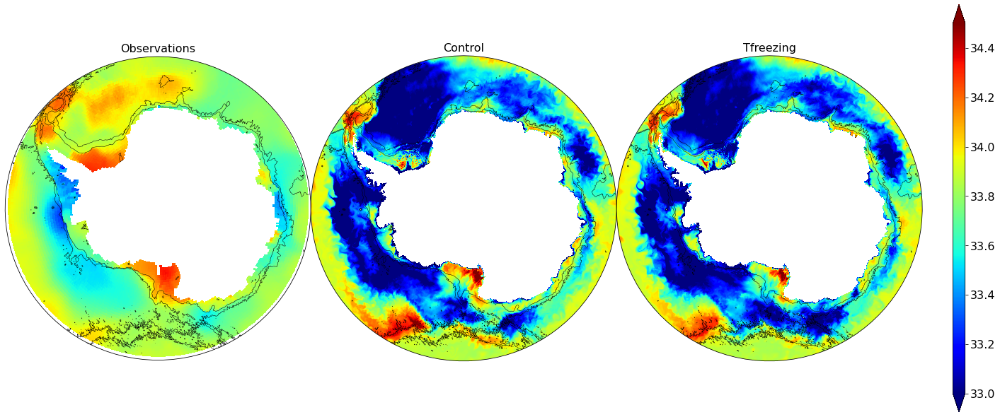

In [13]:
plot_obs(zz=10,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33,vmax=34.5)

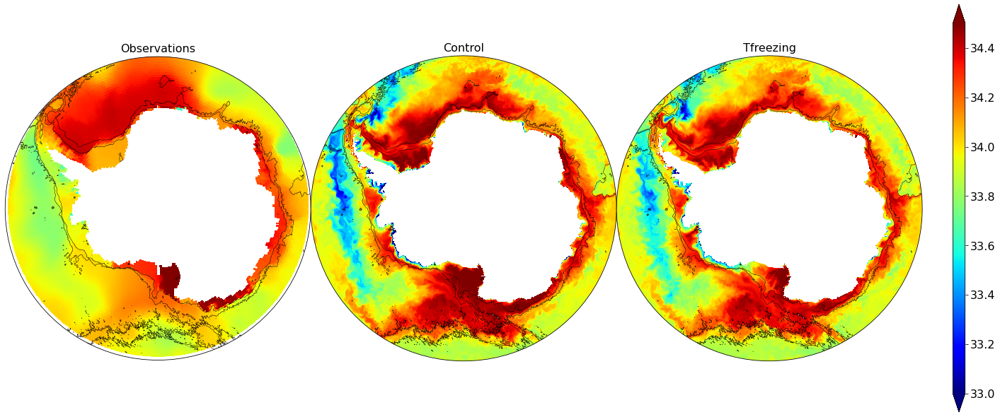

In [14]:
plot_obs(zz=10,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33,vmax=34.5)

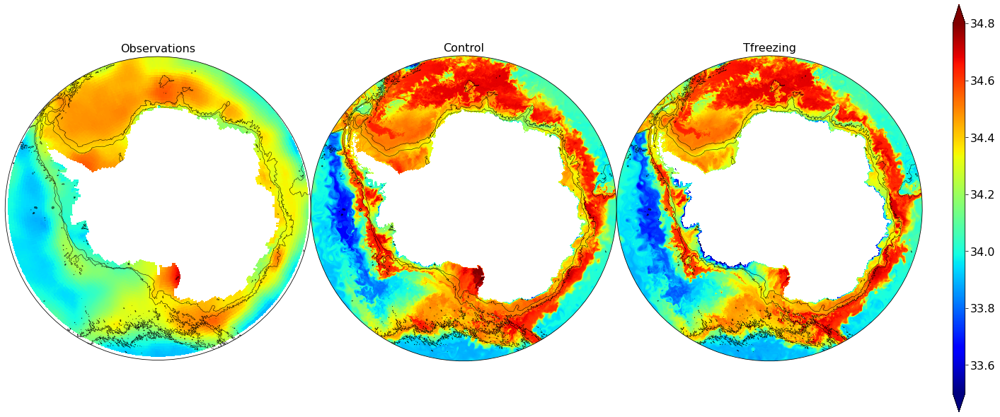

In [15]:
plot_obs(zz=100,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33.5,vmax=34.8)

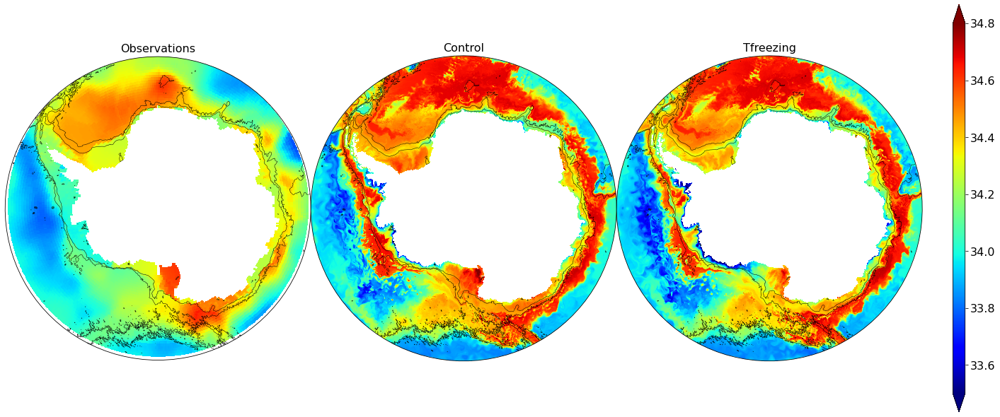

In [16]:
plot_obs(zz=100,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33.5,vmax=34.8)

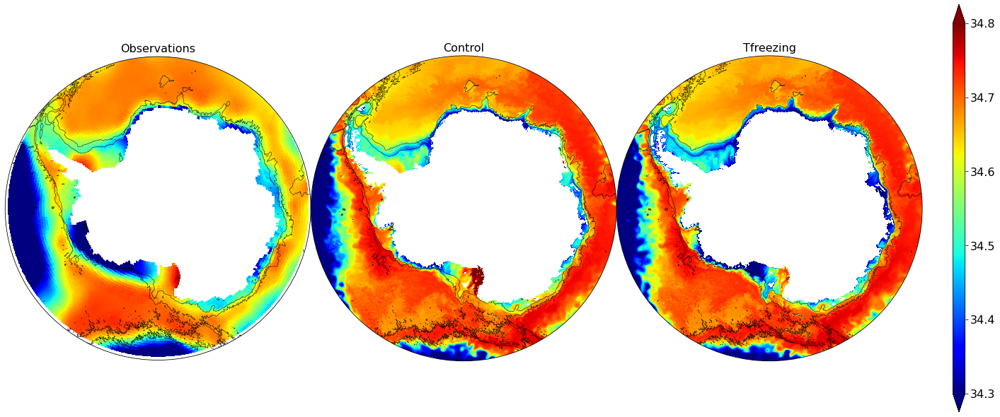

In [17]:
plot_obs(zz=300,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8)

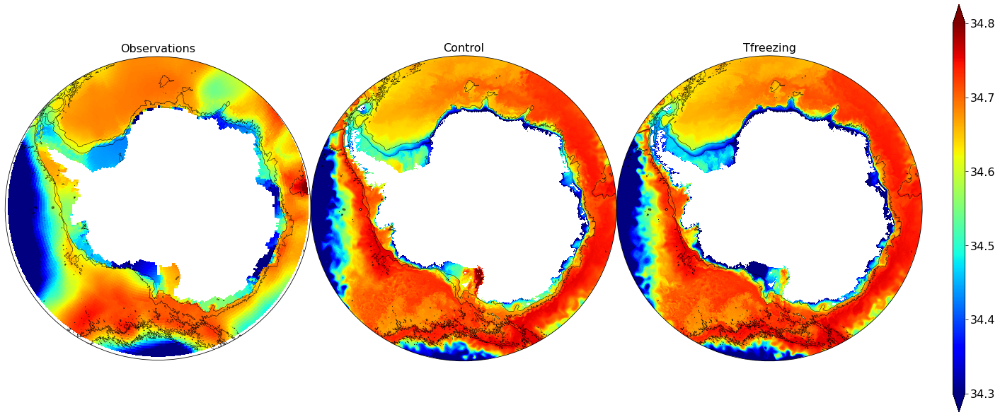

In [18]:
plot_obs(zz=300,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8)

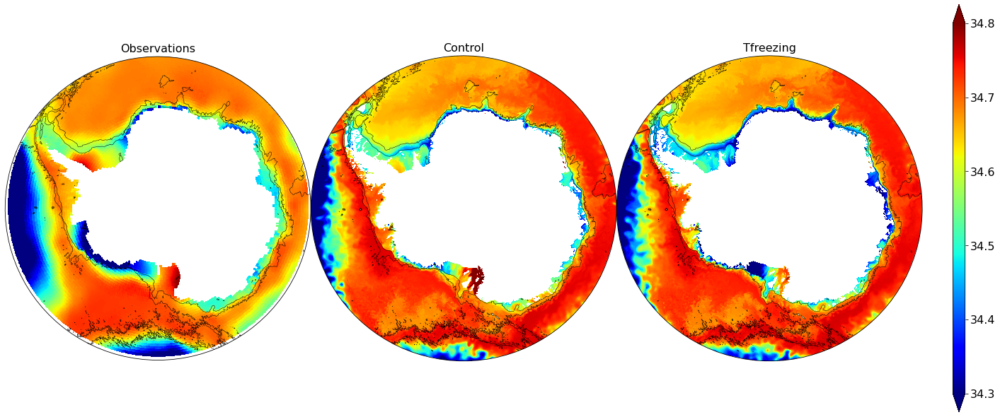

In [19]:
plot_obs(zz=380,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8)

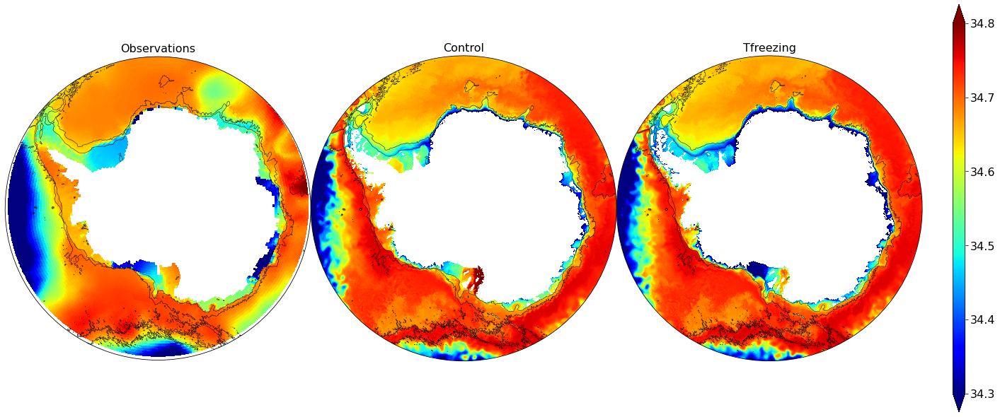

In [20]:
plot_obs(zz=380,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8)

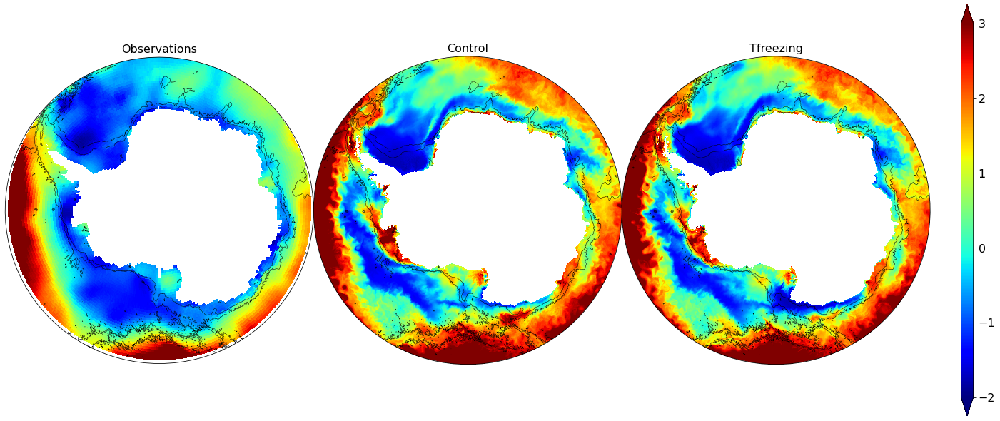

In [21]:
plot_obs(zz=10,tt=0,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-2,vmax=3)

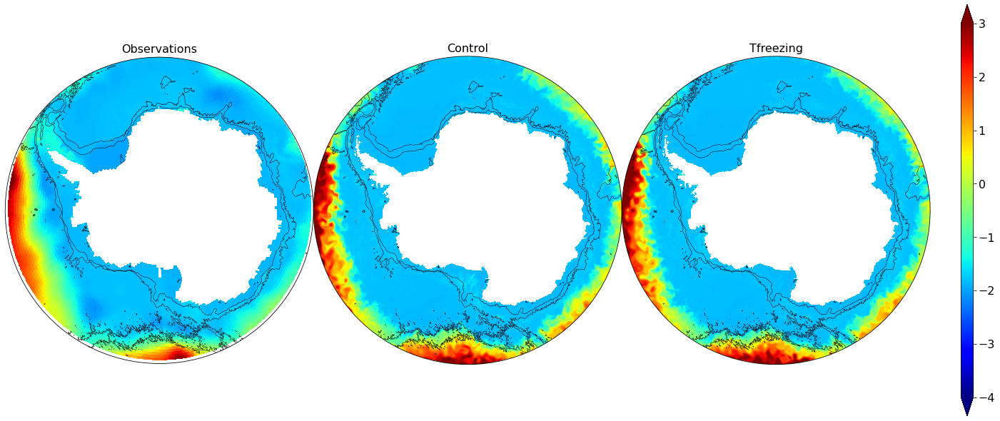

In [22]:
plot_obs(zz=10,tt=6,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-4,vmax=3)

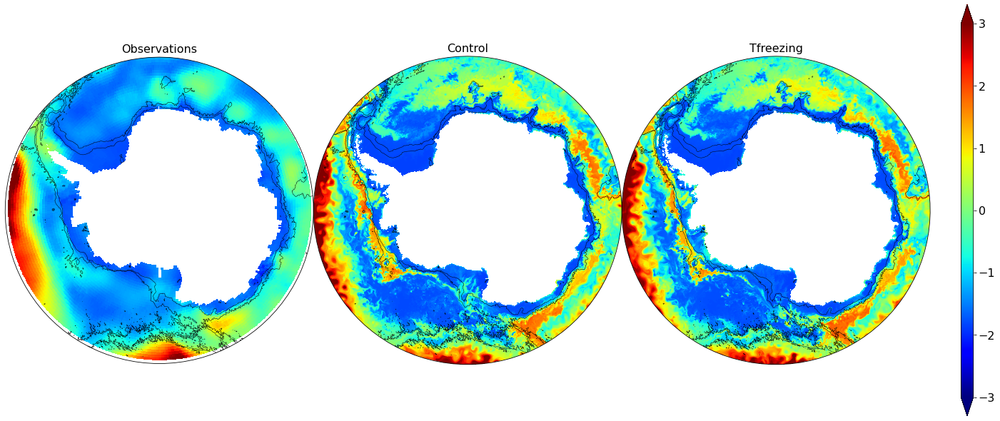

In [23]:
plot_obs(zz=100,tt=0,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

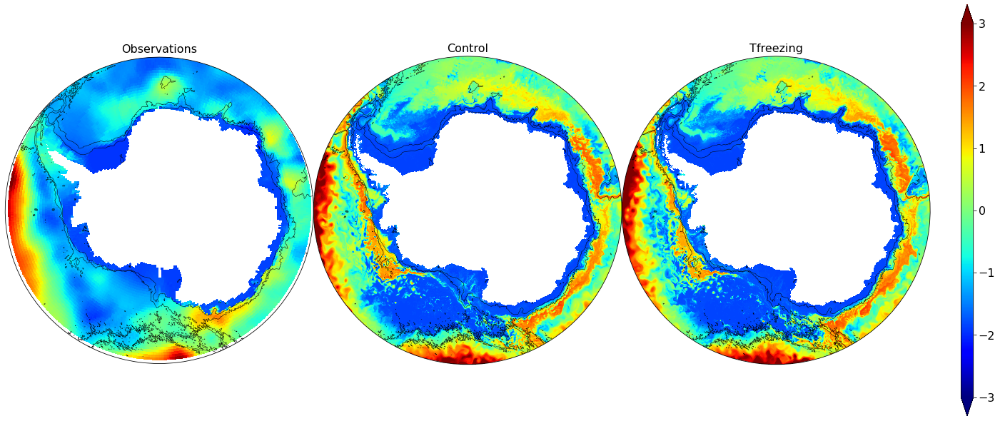

In [24]:
plot_obs(zz=100,tt=6,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

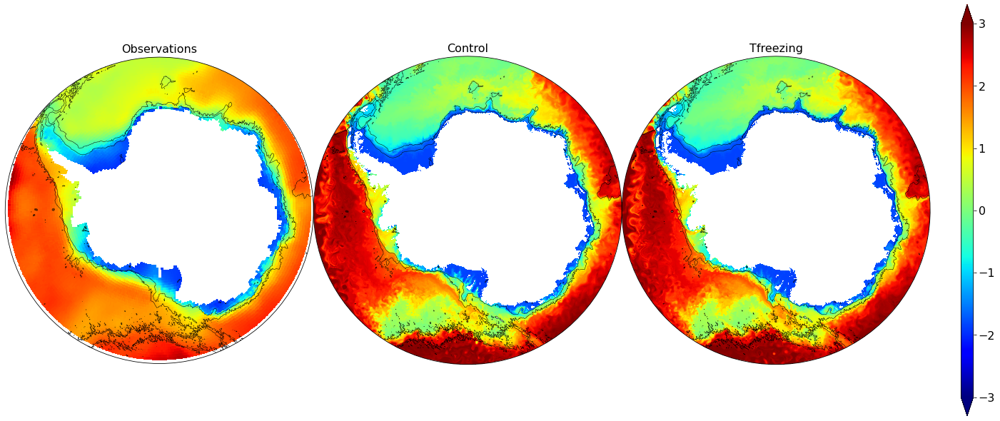

In [25]:
plot_obs(zz=300,tt=0,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

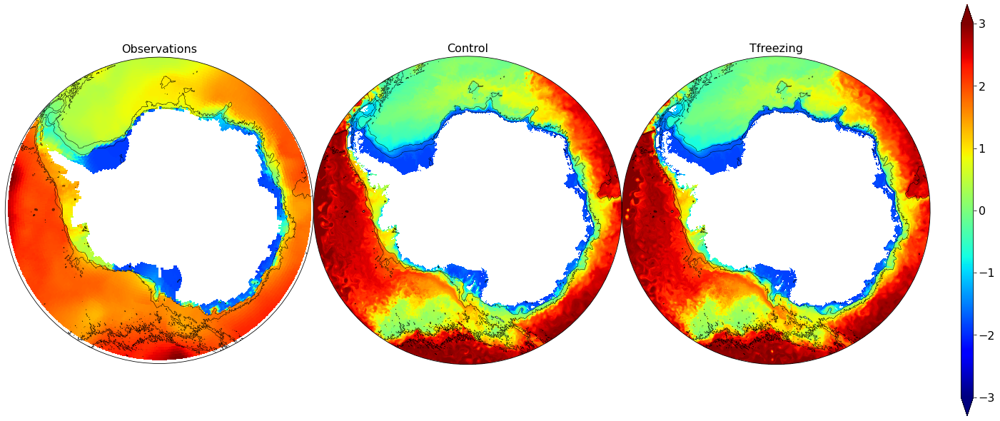

In [26]:
plot_obs(zz=300,tt=6,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

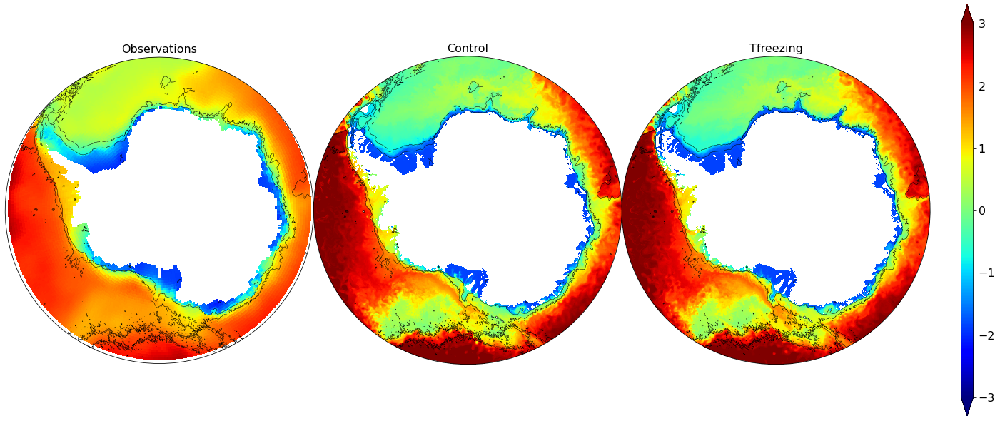

In [27]:
plot_obs(zz=380,tt=0,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

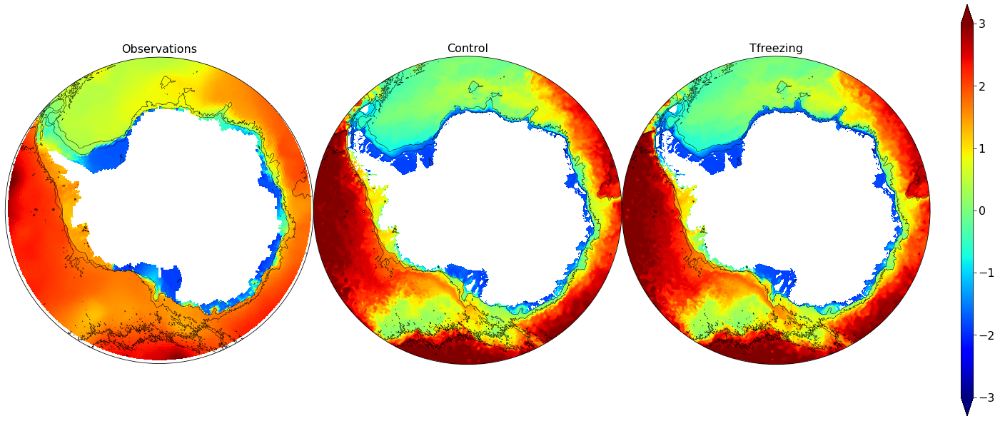

In [28]:
plot_obs(zz=380,tt=6,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

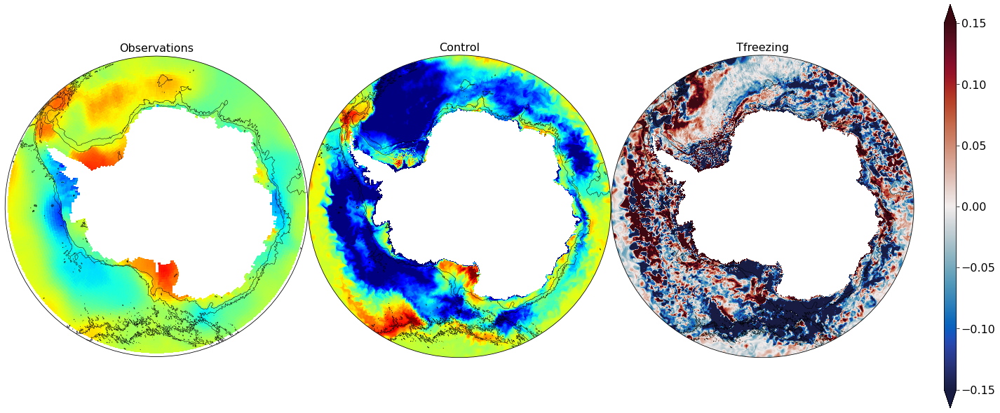

In [29]:
plot_obs_diff(zz=10,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33,vmax=34.5,scale_max=0.15)

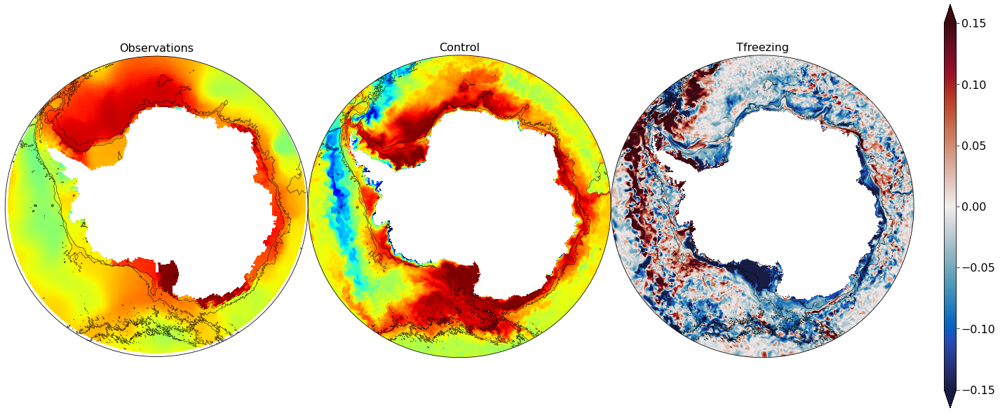

In [30]:
plot_obs_diff(zz=10,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33,vmax=34.5,scale_max=0.15)

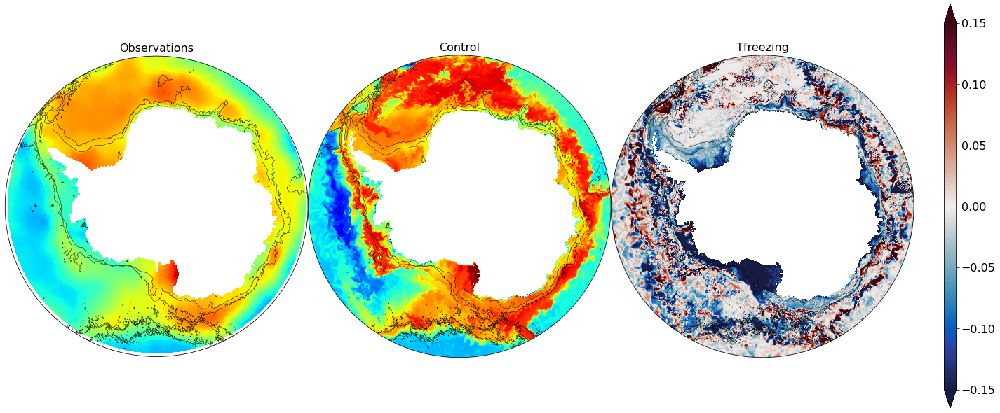

In [31]:
plot_obs_diff(zz=100,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33.5,vmax=34.8,scale_max=0.15)

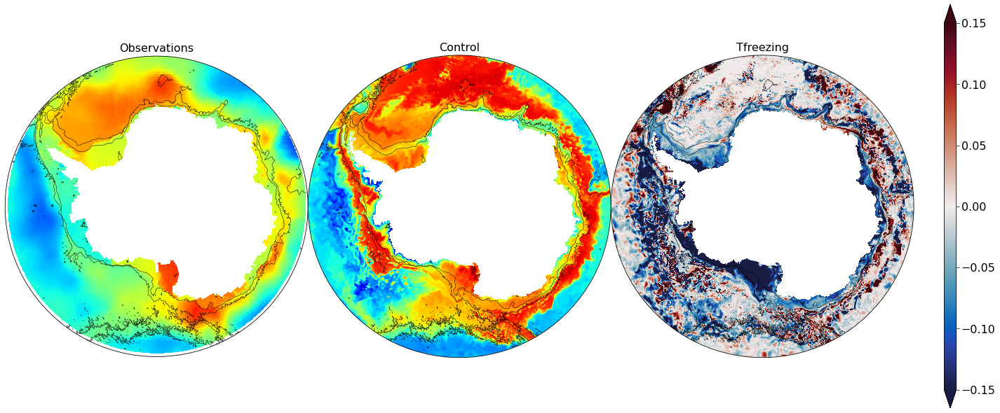

In [32]:
plot_obs_diff(zz=100,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=33.5,vmax=34.8,scale_max=0.15)

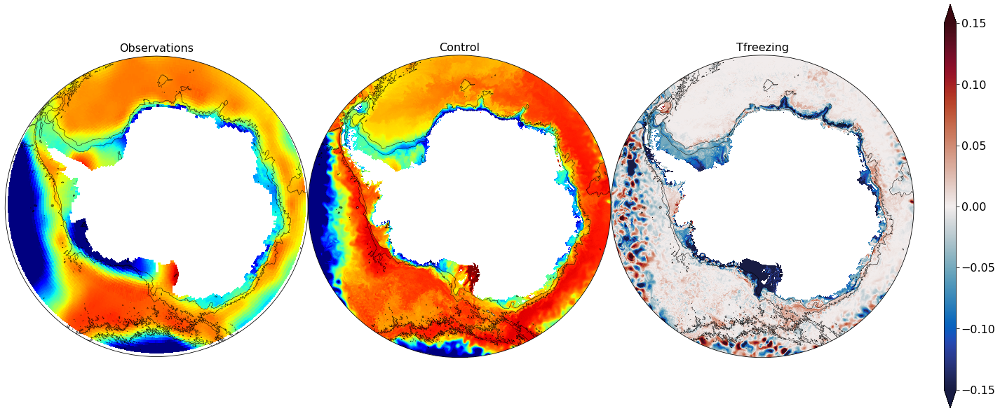

In [33]:
plot_obs_diff(zz=300,tt=0,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8,scale_max=0.15)

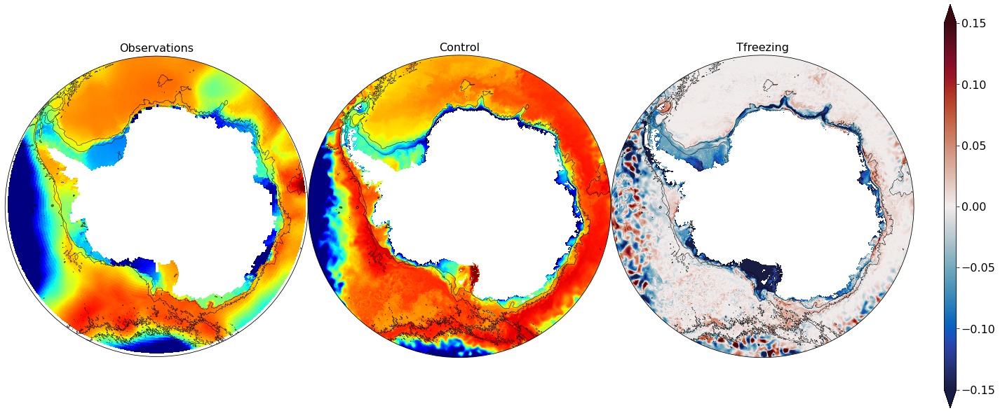

In [34]:
plot_obs_diff(zz=300,tt=6,var_simu=salt_Tfreezing_min_calv_2,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8,scale_max=0.15)

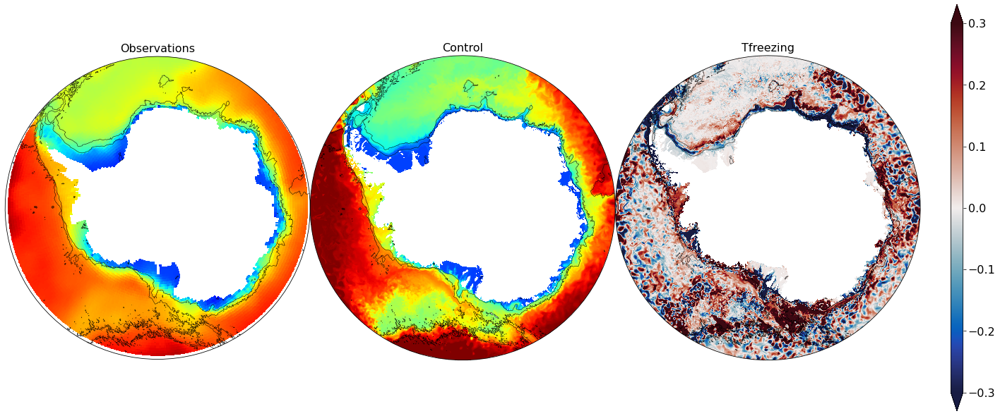

In [35]:
plot_obs_diff(zz=380,tt=0,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3,scale_max=0.3)

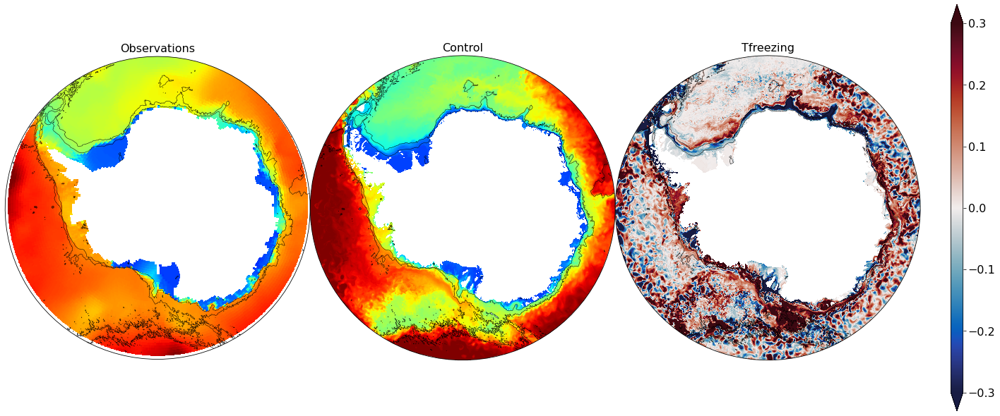

In [36]:
plot_obs_diff(zz=380,tt=6,var_simu=temp_Tfreezing_min_calv_2,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3,scale_max=0.3)